In [228]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [229]:
import numpy as np
import random
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from collections import Counter
from numpy import random
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from pattern.text.en import singularize, pluralize
from textblob import TextBlob
from collections import Counter, defaultdict
import torch
from transformers import AutoTokenizer, AutoModel
from nltk.tokenize import sent_tokenize, word_tokenize
import gensim
import progressbar
from tqdm import tqdm
import pickle


import torch
from transformers import AutoTokenizer, AutoModel

from src.utils import *
from src.config import Config

CONFIG:Config = Config()

In [230]:
df = pd.read_pickle(CONFIG.dataset.train_data_raw)
df.head(15)

,whoTarget,intentYN,sexYN,offensiveYN,speakerMinorityYN,post,targetMinority,targetCategory,targetStereotype,dataSource
0,0.0,1.0,0.0,1.0,0.0,RT @_LexC__: I'm convinced that some of y'all ...,,,,t/davidson
1,0.0,1.0,0.0,1.0,0.0,RT @_LexC__: I'm convinced that some of y'all ...,,,,t/davidson
2,0.0,0.0,0.0,1.0,0.0,RT @_LexC__: I'm convinced that some of y'all ...,,,,t/davidson
3,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,all stupid,t/davidson
4,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,are not people but apes.,t/davidson
5,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,black people are monkeys,t/davidson
6,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,black people are from the jungles,t/davidson
7,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,using racial slurs is okay,t/davidson
8,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,black folks are animals,t/davidson
9,1.0,1.0,0.0,1.0,0.0,RT @iBeZo: Stupid fucking nigger LeBron. You f...,black folks,race,black folks are stupid,t/davidson


In [231]:
# def get_minorities_embedding(df: pd.DataFrame, tokenizer, model):
#     # consider only those they are offensive (have some minority target)
#     mask = df["targetMinority"].apply(lambda x: len(x) > 0)
#     off_df = df[mask]
#     minorities = off_df["targetMinority"].explode().unique().tolist()

#     tokenizer = tokenizer
#     model = model

#     min_counter = Counter(off_df["targetMinority"].values)
#     # for idx, row in off_df["targetMinority"].items():
#     #     min_counter.update([row])
#     # min_counter = dict(sorted(min_counter.items(), key=lambda x:x[1], reverse=True))

#     encoded_input = tokenizer(
#         minorities, padding=True, truncation=True, max_length=100, return_tensors='pt')

#     # Compute token embeddings
#     with torch.no_grad():
#         model_output = model(**encoded_input)

#     # Perform pooling. In this case, mean pooling
#     embeddings = mean_pooling(model_output, encoded_input['attention_mask'])
#     embeddings = embeddings.cpu().numpy()
#     min_emb = dict(zip(minorities, embeddings))

#     return min_counter, min_emb

#### Visualize macro categories in order to not replicate this feature when processing the "minority" one

In [232]:
column = 'targetCategory'
print(f'Macro categories: {df[column].unique()}')

Macro categories: ['' 'race' 'gender' 'social' 'body' 'culture' 'disabled' 'victim']


Visualize what is inside targetMinority for each macro category

In [233]:
def macro_unique_minorities(macro_cat):
    target_macro_rows_mask = df['targetCategory'].isin([macro_cat])
    target_macro_df = df[target_macro_rows_mask]
    print(f"Groups inside ---> *{macro_cat.upper()}*")
    print(f"{target_macro_df['targetMinority'].unique()} \n")

In [234]:
for macro_cat in df['targetCategory'].unique():
    macro_unique_minorities(macro_cat)

Groups inside ---> **
[''] 

Groups inside ---> *RACE*
['black folks' 'white folks' 'black folks, white folks'
 'latino/latina folks' 'black folks, white women' 'white females'
 'asian folks' 'native american/first nation folks' 'White people'
 'smokers' 'black women' 'white people' 'white girls' 'White'
 'black folks, latino/latina folks' 'indigenous folks'
 'light skinned black folks' 'asian folks, latino/latina folks' 'everyone'
 'whites' 'Arab folks' 'non-white folks' 'punjab' 'Indian folks'
 'all pocs' 'people from Abu Dhabi' 'dominican' 'arabic folks' 'syrian'
 'black folks, asian folks, latino/latina folks, native american/first nation folks'
 'aborigines' 'chinese folks' 'middle eastern people' 'people from india'
 'Irish folks' 'Indians' 'prostitutes' 'Venezuela' 'Ethiopian'
 'african folks' 'African kids' 'aboriginals' 'Somalia'
 'latino/latina folks, arabs' 'black folks, asian folks' 'Japanese'
 'Japanese folks' 'white men' 'Ethiopian people' 'Ethiopians'
 'north koreans' 'b

## Sentence-Transformers embedding

In [235]:
embedding_tokenizer = AutoTokenizer.from_pretrained(
    "sentence-transformers/all-mpnet-base-v2")
embedding_model = AutoModel.from_pretrained(
    "sentence-transformers/all-mpnet-base-v2")

min_counter, min_emb = get_minorities_embedding(
    df, embedding_tokenizer, embedding_model)

Visualizing dict of embeddings

In [236]:
min_emb

{'black folks': array([ 3.95884067e-02,  1.59501106e-01,  2.69873030e-02, -9.51439291e-02,
         4.66722623e-02,  8.48870724e-02,  6.26136661e-02, -7.30798393e-02,
        -9.80665833e-02, -4.79647480e-02, -4.47268225e-02, -2.04145312e-02,
         9.71068740e-02, -1.28721535e-01,  1.37306109e-01, -8.71544890e-03,
        -6.89416286e-03,  1.56226784e-01, -1.73811048e-01, -1.28138354e-02,
        -1.71662077e-01,  1.08580872e-01,  4.74720262e-02, -3.77914892e-03,
        -3.63180935e-02,  4.12961915e-02, -5.18468618e-02, -3.74632329e-02,
        -5.11173233e-02,  7.98985511e-02,  1.05085276e-01,  3.16856205e-02,
        -1.00205608e-01, -1.87568069e-02,  5.35744675e-06, -5.49501739e-02,
        -5.59008354e-03,  9.42390189e-02, -7.61238486e-02,  3.09312567e-02,
         3.34878117e-02,  4.78578806e-02, -4.56412658e-02,  9.59101170e-02,
        -5.74832335e-02, -1.97071701e-01,  2.63739936e-02, -1.64159127e-02,
        -8.40415508e-02, -4.27351668e-02, -4.65195300e-03, -4.74821255e-0

## Minorities analysis

In [237]:
# visualize more similar for all minorities
def select_more_similar(target_minority, minority_emb, min_emb_dict):
    similarity = 0
    similar = ""
    for minority, emb in min_emb_dict.items():
        actual_sim = cosine_similarity(minority_emb, emb)
        if ((actual_sim > similarity) and (target_minority != minority)):
            similar = minority 
            similarity = actual_sim
    return similar

In [238]:
def get_pca_emb(n_comp, embeddings, minorities):
    pca = PCA(n_components=n_comp)
    pca_embs = pca.fit_transform(embedding)
    pca_min_emb = {k: v for k, v in zip(minorities, pca_embs)}
    return pca_min_emb

In [239]:
embedding = np.asarray([emb for _,emb in min_emb.items()])

In [240]:
minorities = np.asarray([minority for minority,_ in min_emb.items()])

In [241]:
def update_embedding_minorities():
    min_counter, min_emb = get_minorities_embedding(
        df, embedding_tokenizer, embedding_model)
    embedding = np.asarray([emb for _, emb in min_emb.items()])
    minorities = np.asarray([minority for minority, _ in min_emb.items()])
    return min_counter, min_emb, embedding, minorities

Visualizing lengths of minorities

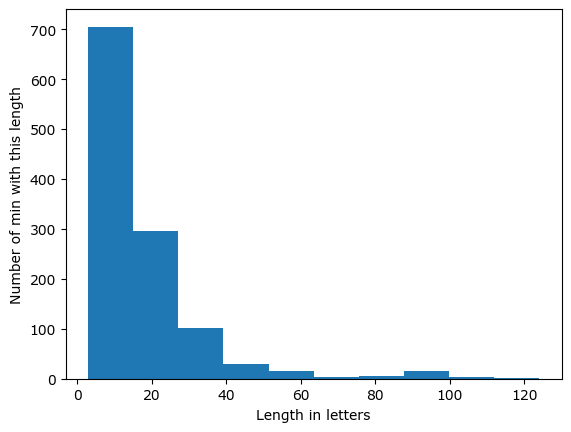

In [242]:
import matplotlib.pyplot as plt
import numpy as np

lengths_minorities = [len(item) for item in list(min_emb.keys())]

plt.hist(lengths_minorities)
plt.xlabel('Length in letters')
plt.ylabel('Number of min with this length')
plt.show()

Visualizing counter for each minority (how many times we found each)

In [243]:
min_counter

Counter({'black folks': 11473,
         'women': 8442,
         'black women': 6,
         'conservatives': 142,
         'republicans': 4,
         'ugly folks': 94,
         'gay men': 1057,
         'poor folks': 140,
         'lesbian women': 202,
         'overweight/fat folks': 333,
         'white folks': 146,
         'black folks, white folks': 13,
         'AAP': 2,
         'folks with mental illness/disorder, mentally disabled folks': 45,
         'mentally disabled folks': 513,
         'folks with mental illness/disorder': 404,
         'latino/latina folks': 599,
         'lesbian women, gay men': 232,
         'muslim folks': 1749,
         'jewish folks, muslim folks': 29,
         'physically disabled folks': 846,
         'women, gay men': 19,
         'black folks, white women': 2,
         'white females': 2,
         'men': 165,
         'gay men, trans women, trans men, bisexual women, bisexual men': 8,
         'Islam': 6,
         'assault victims': 782,
      

In [244]:
def coverage_minorities(n_of_presence, verbose=False):
    minorities = {}
    for minority, presence in min_counter.items():
        if presence in n_of_presence:
            minorities.update({minority: presence})
    print(f'Number of minorities with {n_of_presence} coverages: {len(minorities)}')
    if verbose:
        for minority in minorities:
            print(minority)
    return minorities

Minorities present 1 time

In [245]:
coverage_minorities([1], verbose=True)

Number of minorities with [1] coverages: 126
sex trafficking victims
car accident victims
prisoners
OD victims
victims of racial and homophobic attacks
people who've had abortions
women who have had abortions
victims of rape and murder
Refugees
Victims of poverty and starvation
victims of domestic violence
tragedy victim
Bombing victums
people who self-harm/are suicidal
violent accidental death victims
fire victims
auto accident victims
assault victims, Holocaust victims
murder victim families
sexual assault survivors
Parents of stillborn infants
Homicide victims
mass suicide victims
pedophilia
child rape victim
nuclear victims
HIV positive
Necrophilia victims
Kidnap/violence/murder victims
health related tragedy victims
Molestation Victims
Disaster
chernobyl victims
Holocaust victims and black victims of slavery
car crash victims
genital mutilation victims
mutilation victims
assault victims, child molestation victims
Domestic abuse
environmental victims
death
Car crash victims.
mass a

{'sex trafficking victims': 1,
 'car accident victims': 1,
 'prisoners': 1,
 'OD victims': 1,
 'victims of racial and homophobic attacks': 1,
 "people who've had abortions": 1,
 'women who have had abortions': 1,
 'victims of rape and murder': 1,
 'Refugees': 1,
 'Victims of poverty and starvation': 1,
 'victims of domestic violence': 1,
 'tragedy victim': 1,
 'Bombing victums': 1,
 'people who self-harm/are suicidal': 1,
 'violent accidental death victims': 1,
 'fire victims': 1,
 'auto accident victims': 1,
 'assault victims, Holocaust victims': 1,
 'murder victim families': 1,
 'sexual assault survivors': 1,
 'Parents of stillborn infants': 1,
 'Homicide victims': 1,
 'mass suicide victims': 1,
 'pedophilia': 1,
 'child rape victim': 1,
 'nuclear victims': 1,
 'HIV positive': 1,
 'Necrophilia victims': 1,
 'Kidnap/violence/murder victims': 1,
 'health related tragedy victims': 1,
 'Molestation Victims': 1,
 'Disaster': 1,
 'chernobyl victims': 1,
 'Holocaust victims and black victim

In [246]:
coverage_minorities([2], verbose=True)

Number of minorities with [2] coverages: 626
AAP
black folks, white women
white females
smokers
Mormon folks
skinny folks
old ladies
breast size
white girls
Virgos
indigenous folks
light skinned black folks
people with OCD
Worcester
shiv sena political party
Gun enthusiasts
fascists
young people
Jehovah witnes
Arab folks
Non - binary
liberals, Democrats
women, trans men
liberals, feminists
punjab
high school students
conservatives, Republicans
islamics
England
all pocs
Canada
Korea
Amsterdam
18 year olds
Syrian rebels
people from Abu Dhabi
Millennials
Younger people
younger genereration
dominican women
dominican
manners
women, lesbian women, feminists
gamers
conservatives, alt right
politicians
syrians, russians
Syrians/Russians
syrian and russian folks
Kids
liberals, democrats
furries
trump supporters
assad region
philistine
russins
Antifa
anti-vaxxers
Russia
well off folks
everybody not in the US (foreigners)
aborigines
aboriginal
Welsh
people from india
assault victims, kidnap victi

{'AAP': 2,
 'black folks, white women': 2,
 'white females': 2,
 'smokers': 2,
 'Mormon folks': 2,
 'skinny folks': 2,
 'old ladies': 2,
 'breast size': 2,
 'white girls': 2,
 'Virgos': 2,
 'indigenous folks': 2,
 'light skinned black folks': 2,
 'people with OCD': 2,
 'Worcester': 2,
 'shiv sena political party': 2,
 'Gun enthusiasts': 2,
 'fascists': 2,
 'young people': 2,
 'Jehovah witnes': 2,
 'Arab folks': 2,
 'Non - binary': 2,
 'liberals, Democrats': 2,
 'women, trans men': 2,
 'liberals, feminists': 2,
 'punjab': 2,
 'high school students': 2,
 'conservatives, Republicans': 2,
 'islamics': 2,
 'England': 2,
 'all pocs': 2,
 'Canada': 2,
 'Korea': 2,
 'Amsterdam': 2,
 '18 year olds': 2,
 'Syrian rebels': 2,
 'people from Abu Dhabi': 2,
 'Millennials': 2,
 'Younger people': 2,
 'younger genereration': 2,
 'dominican women': 2,
 'dominican': 2,
 'manners': 2,
 'women, lesbian women, feminists': 2,
 'gamers': 2,
 'conservatives, alt right': 2,
 'politicians': 2,
 'syrians, russians

Minorities present between 3 and 5 times

In [247]:
coverage_minorities(range(3,6), verbose=True)

Number of minorities with range(3, 6) coverages: 173
republicans
physically disabled folks, fat folks
mexican
assault victims, rape victims
Rural people
assault victims, Sexual assault victims
Rednecks
muslim folks, hindu folks
islam
teenagers
millenials
syrian
independents/libertarians
Gemini
South Asia
lesbian women, bisexual women
south africans
aboriginal folks
middle eastern people
Parents
war crime victims
African kids
autistic
people who have had abortions
aboriginals
British
Vegans
muslim folks, refugees
Ethiopian people
north koreans
black folks, asian folks, brown/asian people
Nigerian people
accident victims
Emo folks
young kids
women, lesbian women, bisexual women, all feminists
redneck
sex abuse victims
muslim folks, Japanese folks
arabic folks, Japan
middle-eastern folks
emo
Jewish people
minors
rural people
suicide
somalian
Child murder victims
Vietnamese
korean folks
Japanese folk
all disabled folks
italian folks
islamic folks
holocaust survivors
terrorism victims, assa

{'republicans': 4,
 'physically disabled folks, fat folks': 4,
 'mexican': 4,
 'assault victims, rape victims': 5,
 'Rural people': 4,
 'assault victims, Sexual assault victims': 3,
 'Rednecks': 4,
 'muslim folks, hindu folks': 3,
 'islam': 4,
 'teenagers': 4,
 'millenials': 4,
 'syrian': 4,
 'independents/libertarians': 4,
 'Gemini': 4,
 'South Asia': 4,
 'lesbian women, bisexual women': 4,
 'south africans': 4,
 'aboriginal folks': 4,
 'middle eastern people': 4,
 'Parents': 4,
 'war crime victims': 5,
 'African kids': 4,
 'autistic': 4,
 'people who have had abortions': 3,
 'aboriginals': 4,
 'British': 4,
 'Vegans': 4,
 'muslim folks, refugees': 4,
 'Ethiopian people': 4,
 'north koreans': 4,
 'black folks, asian folks, brown/asian people': 3,
 'Nigerian people': 4,
 'accident victims': 5,
 'Emo folks': 4,
 'young kids': 4,
 'women, lesbian women, bisexual women, all feminists': 3,
 'redneck': 4,
 'sex abuse victims': 3,
 'muslim folks, Japanese folks': 3,
 'arabic folks, Japan': 3

Visualizing the most similar sentence to each minority

In [248]:
most_similar_min = {}
for minority, emb in min_emb.items():   
    more_sim = select_more_similar(minority, emb, min_emb)
    most_similar_min.update({minority:more_sim})
    
for minority, similar in most_similar_min.items():
    print(f"{minority} ---> {similar}")

black folks ---> white folks
women ---> men
black women ---> white women
conservatives ---> liberals
republicans ---> Democrats
ugly folks ---> ugly folks, Good looking folks
gay men ---> Gay men
poor folks ---> poor folks, conservatives
lesbian women ---> women, lesbian women
overweight/fat folks ---> overweight/fat folks, ugly folks
white folks ---> White folks
black folks, white folks ---> black folks, white people
AAP ---> afghan
folks with mental illness/disorder, mentally disabled folks ---> physically disabled folks, folks with mental illness/disorder
mentally disabled folks ---> disabled people
folks with mental illness/disorder ---> folks with mental illness/disorder, mentally disabled folks
latino/latina folks ---> black folks, latino/latina folks
lesbian women, gay men ---> lesbian women, gay men, bisexual women
muslim folks ---> islamic folks
jewish folks, muslim folks ---> jewish folks, christian folks
physically disabled folks ---> disabled people
women, gay men ---> wome

Trying with pca

In [249]:
pca_emb_15 = get_pca_emb(15, embedding, minorities)
most_similar_min_pca = {}
for minority, emb in pca_emb_15.items():
    more_sim = select_more_similar(minority, emb, pca_emb_15)
    most_similar_min_pca.update({minority: more_sim})

for minority, similar in most_similar_min_pca.items():
    print(f"{minority} ---> {similar}")

black folks ---> White folks
women ---> men
black women ---> white women
conservatives ---> liberals
republicans ---> Democrats
ugly folks ---> ugly folks, Good looking folks
gay men ---> Gay men
poor folks ---> well off folks
lesbian women ---> bisexual women
overweight/fat folks ---> physically disabled folks, fat folks
white folks ---> White folks
black folks, white folks ---> black folks, White
AAP ---> ethiopens
folks with mental illness/disorder, mentally disabled folks ---> physically disabled folks, folks with mental illness/disorder
mentally disabled folks ---> disabled people
folks with mental illness/disorder ---> folks with mental illness/disorder, mentally disabled folks
latino/latina folks ---> asian folks, latino/latina folks
lesbian women, gay men ---> women, bisexual men
muslim folks ---> islamic folks
jewish folks, muslim folks ---> jewish folks, christian folks
physically disabled folks ---> disabled people
women, gay men ---> women, gay men, bisexual men
black folks

In [250]:
pca_emb_50 = get_pca_emb(50, embedding, minorities)
most_similar_min_pca_50 = {}
for minority, emb in pca_emb_50.items():
    more_sim = select_more_similar(minority, emb, pca_emb_50)
    most_similar_min_pca_50.update({minority: more_sim})

for minority, similar in most_similar_min_pca_50.items():
    print(f"{minority} ---> {similar}")


black folks ---> white folks
women ---> girls
black women ---> african women
conservatives ---> liberals
republicans ---> Democrats
ugly folks ---> ugly folks, Good looking folks
gay men ---> Gay men
poor folks ---> poor folks, conservatives
lesbian women ---> women, lesbian women
overweight/fat folks ---> overweight/fat folks, ugly folks
white folks ---> White folks
black folks, white folks ---> black folks, White
AAP ---> Anti-Fa
folks with mental illness/disorder, mentally disabled folks ---> physically disabled folks, folks with mental illness/disorder
mentally disabled folks ---> physically disabled folks
folks with mental illness/disorder ---> folks with mental illness/disorder, mentally disabled folks
latino/latina folks ---> latino/latina folks, people of color
lesbian women, gay men ---> lesbian women, gay men, bisexual women
muslim folks ---> islamic folks
jewish folks, muslim folks ---> jewish folks, christian folks
physically disabled folks ---> disabled people
women, gay m

PCA makes strange association, probably is better to keep all dimensions. For sure it's a bad approach to change minorities with the most similar for all distinct element. They are too much and we must think about a more specific method cause this one is impossible that work for everything. Minorities are so different from each other.

In [251]:
# example
print(f"Association from original embedding: {most_similar_min['old folks']}")
print(f"Association from PCA_15 embedding: {most_similar_min_pca['old folks']}")
print(f"Association from PCA_50 embedding: {most_similar_min_pca_50['old folks']}")

Association from original embedding: old folks, seniors
Association from PCA_15 embedding: rich folks
Association from PCA_50 embedding: old folks, seniors


## Visualization of embedding

In [252]:
# genereting random labels to print in scatter plot of minorities
rand_labels = []
for i in range(20):
    rand_labels.append(random.randint(0, len(minorities) - 1))
    
for i in rand_labels:
    print(minorities[i])

mentally disabled folks
Holocaust Victims
harassment victims
minorities
aboriginal
Sick people
KKK victims
black africans
Brazillian folks
Victims of poverty and starvation
mass shooting victims, murder victims
arabic folks, japanese
russins
Mongolian
folks with mental illness/disorder, Self-harming people
domestic abuse victims
nonwhite
catholics
muslim folks, Africa
homeless


In [253]:
def show_minorities_space(embeddings):
    tsne = TSNE(n_components=2)    
    low_dim_data = tsne.fit_transform(embeddings)
    tsne_df = pd.DataFrame(low_dim_data)
    #tsne_df = tsne_df.rename(columns={0: "coordx", 1: "coordy"})
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    ax = sns.scatterplot(data=tsne_df, x=0, y=1)
    
    for j in range(len(rand_labels)):
        i = rand_labels[j]
        plt.annotate(minorities[i], (tsne_df[0][i], tsne_df[1][i]), size=8, weight='bold', color='k')
    return tsne_df

In [254]:
def show_neighbours(tsne_df, min_index, x_range, y_range):
    near_labels = []
    x = tsne_df_original[0][min_index]
    y = tsne_df_original[1][min_index]
    for index in range(len(tsne_df)):
        if (((x - x_range) < tsne_df[0][index] < (x + x_range)) and ((y - y_range) < tsne_df[1][index] < (y + y_range))):
            near_labels.append(index)
    print(f"The neighbours of {minorities[min_index]}")
    for i in near_labels:
        print(f"{minorities[i]} (index = {i}) : coords = {tsne_df[0][index], tsne_df[1][index]}")
    print("\n")

#### Original embedding

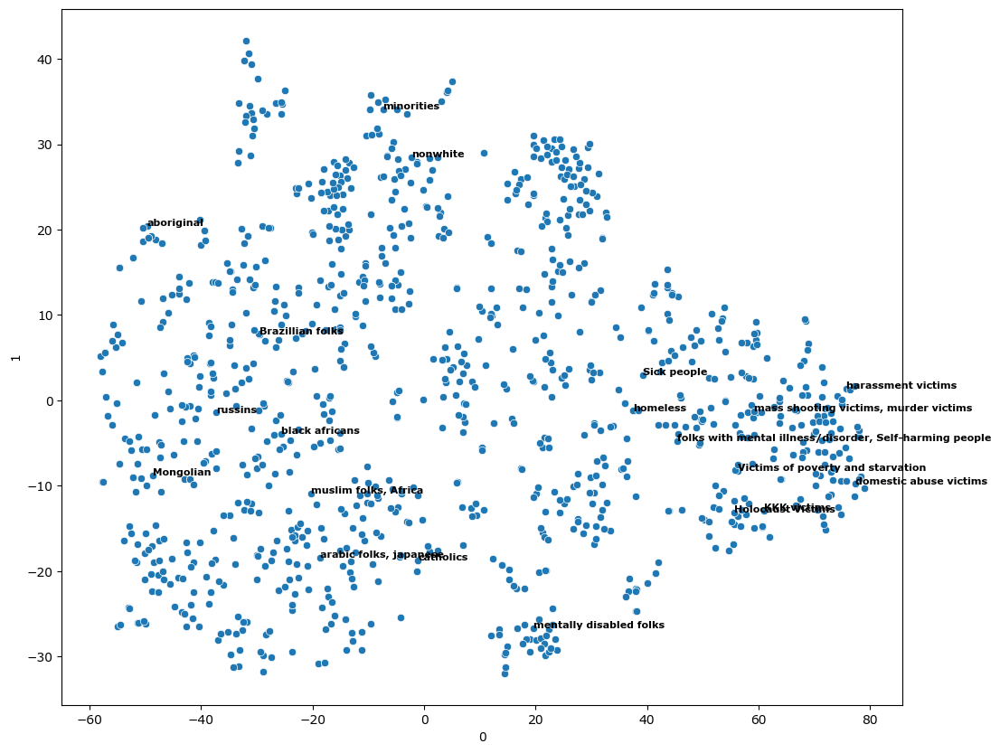

In [255]:
tsne_df_original = show_minorities_space(embedding)

In [256]:
for index in rand_labels:
    show_neighbours(tsne_df_original, index, 5, 5)

The neighbours of mentally disabled folks
folks with mental illness/disorder, mentally disabled folks (index = 13) : coords = (-14.051764, 28.219246)
mentally disabled folks (index = 14) : coords = (-14.051764, 28.219246)
folks with mental illness/disorder (index = 15) : coords = (-14.051764, 28.219246)
physically disabled folks (index = 20) : coords = (-14.051764, 28.219246)
physically disabled folks, fat folks (index = 28) : coords = (-14.051764, 28.219246)
people with OCD (index = 67) : coords = (-14.051764, 28.219246)
physically disabled folks, mentally disabled folks (index = 139) : coords = (-14.051764, 28.219246)
autistic folks (index = 159) : coords = (-14.051764, 28.219246)
folks with physical illness/disorder, folks with mental illness/disorder (index = 175) : coords = (-14.051764, 28.219246)
folks with physical illness/disorder (index = 180) : coords = (-14.051764, 28.219246)
physically disabled folks, folks with physical illness/disorder (index = 189) : coords = (-14.051764

#### PCA embedding

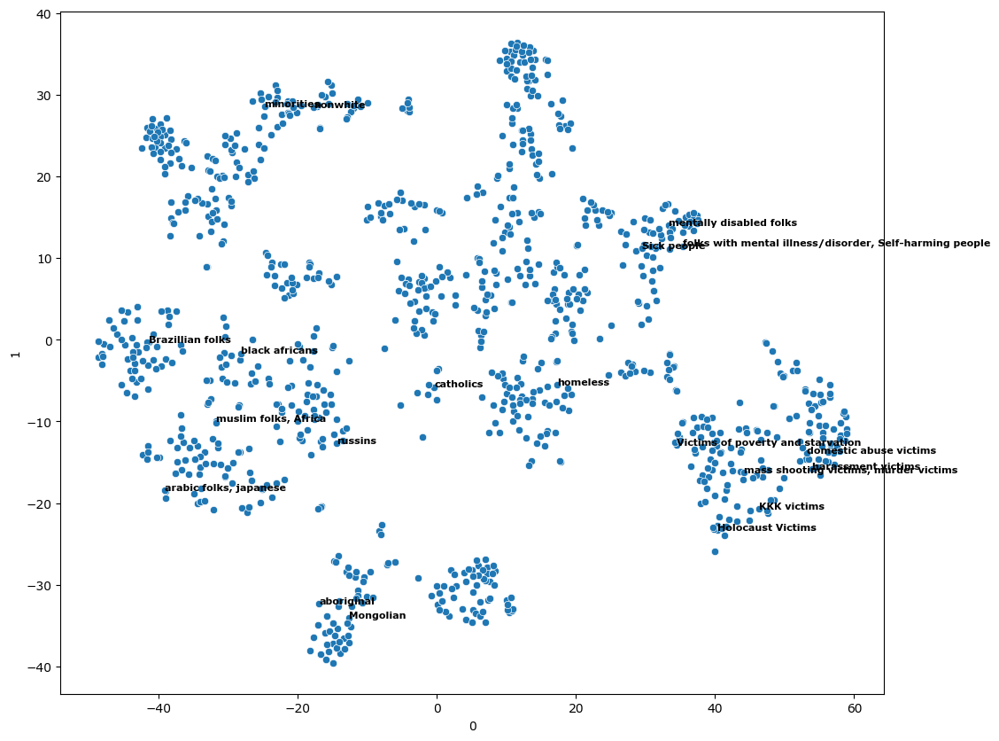

In [257]:
tsne_df_pca15 = show_minorities_space(np.asarray([emb for _,emb in pca_emb_15.items()]))

In [258]:
for index in rand_labels:
    show_neighbours(tsne_df_pca15, index, 5, 5)

The neighbours of mentally disabled folks


The neighbours of Holocaust Victims
assault victims (index = 27) : coords = (-41.06499, 26.236431)
rape victims (index = 33) : coords = (-41.06499, 26.236431)
sexual assault victims (index = 48) : coords = (-41.06499, 26.236431)
assault victims, rape victims (index = 57) : coords = (-41.06499, 26.236431)
assault victims, Sexual assault victims (index = 66) : coords = (-41.06499, 26.236431)
sex trafficking victims (index = 103) : coords = (-41.06499, 26.236431)
assault victims, kidnap victim (index = 179) : coords = (-41.06499, 26.236431)
harassment victims (index = 182) : coords = (-41.06499, 26.236431)
victims of rape and murder (index = 231) : coords = (-41.06499, 26.236431)
victims of domestic violence (index = 256) : coords = (-41.06499, 26.236431)
sex abuse victims (index = 291) : coords = (-41.06499, 26.236431)
assault victims, pedophilia victims (index = 314) : coords = (-41.06499, 26.236431)
Domestic abuse victims (index = 331) : coor

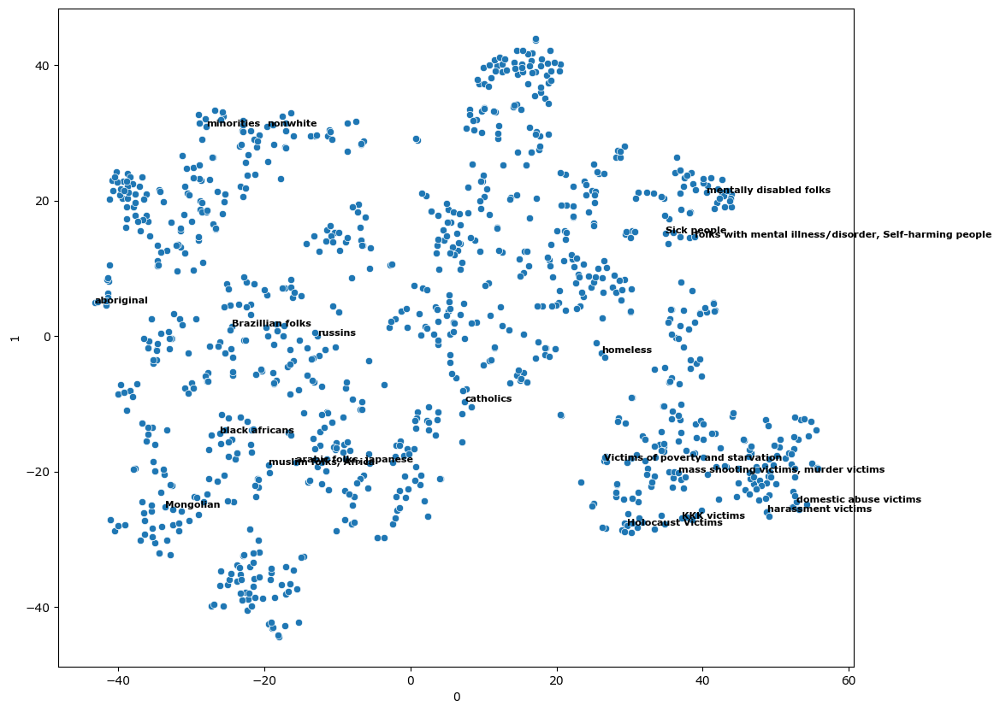

In [259]:
tsne_df_pca50 = show_minorities_space(np.asarray([emb for _,emb in pca_emb_50.items()]))

In [260]:
for index in rand_labels:
    show_neighbours(tsne_df_pca15, index, 5, 5)

The neighbours of mentally disabled folks


The neighbours of Holocaust Victims
assault victims (index = 27) : coords = (-41.06499, 26.236431)
rape victims (index = 33) : coords = (-41.06499, 26.236431)
sexual assault victims (index = 48) : coords = (-41.06499, 26.236431)
assault victims, rape victims (index = 57) : coords = (-41.06499, 26.236431)
assault victims, Sexual assault victims (index = 66) : coords = (-41.06499, 26.236431)
sex trafficking victims (index = 103) : coords = (-41.06499, 26.236431)
assault victims, kidnap victim (index = 179) : coords = (-41.06499, 26.236431)
harassment victims (index = 182) : coords = (-41.06499, 26.236431)
victims of rape and murder (index = 231) : coords = (-41.06499, 26.236431)
victims of domestic violence (index = 256) : coords = (-41.06499, 26.236431)
sex abuse victims (index = 291) : coords = (-41.06499, 26.236431)
assault victims, pedophilia victims (index = 314) : coords = (-41.06499, 26.236431)
Domestic abuse victims (index = 331) : coor

## Working on minorities (pre-processing)

In [261]:
def handling_1time_min(minorities_list, df, tokenizer, model): 
    handling_1time = {}
    for minority in minorities_list:
        target_posts = df[df['targetMinority'] == minority]['post'].values
        for t in range(len(target_posts)): # with this we handle minorities repeated 2 times but which are in different posts
            target_post = target_posts[t]
            # rows related to the post associated with minority (to recover other minorities associated with the same post) 
            rows = df[df['post'] == target_post]
            minorities = rows['targetMinority'].tolist()
            len_min = len(minorities)
            # if n == 1 there is nothing to compare 
            similarity_dict = {}
            if len_min > 1: 
                target_post_tokenized = embedding_tokenizer(
                    target_post, padding=True, truncation=True, max_length=100, return_tensors='pt')
                with torch.no_grad():
                    model_output_post = model(**target_post_tokenized)
                emb_post = mean_pooling(
                    model_output_post, target_post_tokenized['attention_mask'])
                emb_post = emb_post.detach().numpy()
                minorities_embeddings_list = []
                for i in range(len_min):
                    tokenized = tokenizer(
                        minorities[i], padding=True, truncation=True, max_length=100, return_tensors='pt')
                    with torch.no_grad():
                        model_output = model(**tokenized)
                    embedding = mean_pooling(model_output, tokenized['attention_mask'])
                    embedding = embedding.detach().numpy()
                    minorities_embeddings_list.append(embedding)
                # computing most similar minority
                index_similar = 0
                similarity_score = 0
                for i in range(len_min):
                    similarity = cosine_similarity(emb_post[0], minorities_embeddings_list[i][0])
                    similarity_dict.update({minorities[i] : similarity})
                    if similarity > similarity_score:
                        index_similar = i
                        similarity_score = similarity
                handling_1time.update({target_post : [minorities[index_similar], similarity_dict]})
    return handling_1time

In [262]:
def clean_operation(mapping:dict):
    print('number of minorities: ')
    print(f'before: {len(minorities)}')
    for i in range(len(df['targetMinority'])):
        target = df.loc[i,'targetMinority']
        if (target in mapping):
            df.loc[i, 'targetMinority'] = mapping[target]
    new_min_counter, new_min_emb, new_embedding, new_minorities = update_embedding_minorities()
    print(f'after: {len(new_minorities)}')
    return new_min_counter, new_min_emb, new_embedding, new_minorities

In [263]:
# non trova empy minority? strano, riguardare
def check_empty(minorities, df):
    post_with_empty_minority = []
    for minority in minorities:
        posts = df[df['targetMinority'] == minority]['post'].values
        previous_post = ""
        for post in posts:
            if post != previous_post:
                previous_post = post
                temp = df[df['post'] == post]
                minorities_post = temp['targetMinority'].values
                empty = False
                fill = False
                for minority_post in minorities_post: 
                    if minority_post == "":
                        empty = True
                    else: 
                        fill = True
                if empty and fill:
                    post_with_empty_minority.append(post)
    return post_with_empty_minority

#### Looking for empty minority inside annotated post

In [264]:
post_with_empty_minority = check_empty(minorities, df)

In [265]:
print(f"There are -- {len(post_with_empty_minority)} -- posts annotated but with an empty cell in the 'targetMinority' column ")

There are -- 127 -- posts annotated but with an empty cell in the 'targetMinority' column 


#### Managing labels with multiple minorities ( , and / used to separate multiple minorities)

In [266]:
multilabels = []
for minority in minorities:
    if "," in minority or "/" in minority:
        multilabels.append(minority)
        
print(f"There are {len(multilabels)} multilabels with , and/or /")

There are 241 multilabels with , and/or /


In [267]:
multilabels

['overweight/fat folks',
 'black folks, white folks',
 'folks with mental illness/disorder, mentally disabled folks',
 'folks with mental illness/disorder',
 'latino/latina folks',
 'lesbian women, gay men',
 'jewish folks, muslim folks',
 'women, gay men',
 'black folks, white women',
 'gay men, trans women, trans men, bisexual women, bisexual men',
 'physically disabled folks, fat folks',
 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men',
 'native american/first nation folks',
 'women, men',
 'muslim folks, arabic folks',
 'liberals, conservatives',
 'black folks, latino/latina folks',
 'assault victims, rape victims',
 'trans women, trans men',
 'asian folks, latino/latina folks',
 'assault victims, Sexual assault victims',
 'liberals, Democrats',
 'women, trans men',
 'liberals, feminists',
 'conservatives, Republicans',
 'muslim folks, hindu folks',
 'women, lesbian women',
 'women, lesbian women, feminists',
 'independents/libertarians',
 'physically

We noticed that the "," is used to separate different minority groups (e.g. black folks and white women). 
On the contrary the "/" indicates two synonyms referring to the same group.
Unfortunately this rule is not always used correctly. Let's inspect this two paradigms separately

Labels with both comma and slash ---> choice: take only 1 of the synonyms divided by the slash. Which one? Opting for the longer that is supposed to be more precise 

In [268]:
# Comma + / multilabels simultaneously
multilabels_both = []
for minority in minorities:
    if "," in minority and "/" in minority:
        multilabels_both.append(minority)
multilabels_both

['folks with mental illness/disorder, mentally disabled folks',
 'black folks, latino/latina folks',
 'asian folks, latino/latina folks',
 'black folks, asian folks, latino/latina folks, native american/first nation folks',
 'folks with physical illness/disorder, folks with mental illness/disorder',
 'physically disabled folks, folks with physical illness/disorder',
 'physically disabled folks, folks with physical illness/disorder, folks with mental illness/disorder, mentally disabled folks',
 'latino/latina folks, arabs',
 'black folks, asian folks, brown/asian people',
 'latino/latina folks, jewish',
 'physically disabled folks, folks with mental illness/disorder, mentally disabled folks',
 'folks with mental illness/disorder, Self-harming people',
 'black folks, latino/latina folks, native american/first nation folks',
 'physically disabled folks, folks with mental illness/disorder',
 'black folks, native american/first nation folks',
 'black folks, asian folks, latino/latina folks,

In [269]:
print(f"There are {len(multilabels_both)} multilabels with both , and /")

There are 50 multilabels with both , and /


In [270]:
# creating dict with label : new:label
labels_comma_slash = {}
for minority in multilabels_both:
    final_minority = ""
    sub_comma = minority.split(",") # list of minority separated at ,
    for sub in sub_comma:
        if "/" not in sub:
            if final_minority != "": final_minority = final_minority + ","
            final_minority = final_minority + sub
        else:
            if final_minority != "": final_minority = final_minority + ","
            sub_slash = sub.split("/")
            if len(sub_slash[0]) > len(sub_slash[1]):
                final_minority = final_minority + sub_slash[0]
            else:
                if final_minority != "": final_minority = final_minority + " "
                final_minority = final_minority + sub_slash[1]
    labels_comma_slash.update({minority : final_minority})

In [271]:
labels_comma_slash

{'folks with mental illness/disorder, mentally disabled folks': 'folks with mental illness, mentally disabled folks',
 'black folks, latino/latina folks': 'black folks, latina folks',
 'asian folks, latino/latina folks': 'asian folks, latina folks',
 'black folks, asian folks, latino/latina folks, native american/first nation folks': 'black folks, asian folks, latina folks, first nation folks',
 'folks with physical illness/disorder, folks with mental illness/disorder': 'folks with physical illness, folks with mental illness',
 'physically disabled folks, folks with physical illness/disorder': 'physically disabled folks, folks with physical illness',
 'physically disabled folks, folks with physical illness/disorder, folks with mental illness/disorder, mentally disabled folks': 'physically disabled folks, folks with physical illness, folks with mental illness, mentally disabled folks',
 'latino/latina folks, arabs': 'latina folks, arabs',
 'black folks, asian folks, brown/asian people':

In [272]:
min_counter, min_emb, embedding, minorities = clean_operation(labels_comma_slash)

number of minorities: 
before: 1179


after: 1179


Labels with only comma ---> choice: leave everything as it is 

In [273]:
# , only multilabels 
multilabels_comma = []
for minority in minorities:
    if "," in minority and "/" not in minority:
        multilabels_comma.append(minority)
multilabels_comma

['black folks, white folks',
 'folks with mental illness, mentally disabled folks',
 'lesbian women, gay men',
 'jewish folks, muslim folks',
 'women, gay men',
 'black folks, white women',
 'gay men, trans women, trans men, bisexual women, bisexual men',
 'physically disabled folks, fat folks',
 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men',
 'women, men',
 'muslim folks, arabic folks',
 'liberals, conservatives',
 'black folks, latina folks',
 'assault victims, rape victims',
 'trans women, trans men',
 'asian folks, latina folks',
 'assault victims, Sexual assault victims',
 'liberals, Democrats',
 'women, trans men',
 'liberals, feminists',
 'conservatives, Republicans',
 'muslim folks, hindu folks',
 'women, lesbian women',
 'women, lesbian women, feminists',
 'physically disabled folks, mentally disabled folks',
 'conservatives, alt right',
 'syrians, russians',
 'liberals, democrats',
 'black folks, asian folks, latina folks, first nation folks',

In [274]:
print(f"There are {len(multilabels_comma)} multilabels with only ,") # there are also the new created above now

There are 217 multilabels with only ,


Labels with only slash ---> choice: as done above we split at / and we take the longer description

In [275]:
# / only multilabels
multilabels_slash = []
for minority in minorities:
    if "," not in minority and "/" in minority:
        multilabels_slash.append(minority)
multilabels_slash

['overweight/fat folks',
 'folks with mental illness/disorder',
 'latino/latina folks',
 'native american/first nation folks',
 'independents/libertarians',
 'Syrians/Russians',
 'folks with physical illness/disorder',
 'rural/ country folks',
 'people who self-harm/are suicidal',
 'Africa/Middle East',
 'bullimacs/anorexics',
 'Kidnap/violence/murder victims',
 'eastern/indian people',
 'Gypsies/ Romani',
 'victims of 9/11',
 'rednecks/South region in the US',
 'middle eastern / arabic people',
 'Everyone/parents/children',
 'middle east/africa',
 'southerners/ rednecks',
 'any racial/ethnic minority in America',
 'Millenials/Generation Z',
 'Members of the Irish Repulbican Army and/or the IRA political group in Ireland.',
 'Pakistan/Indian people']

In [276]:
print(f"There are {len(multilabels_slash)} multilabels with only ,")

There are 24 multilabels with only ,


In [277]:
# creating dict with label : new:label
labels_only_slash = {}
for minority in multilabels_slash:
    final_minority = ""
    sub_slash = minority.split("/")
    if len(sub_slash[0]) > len(sub_slash[1]):
        final_minority = sub_slash[0]
    else:
        final_minority = sub_slash[1]
    labels_only_slash.update({minority: final_minority})

In [278]:
labels_only_slash

{'overweight/fat folks': 'overweight',
 'folks with mental illness/disorder': 'folks with mental illness',
 'latino/latina folks': 'latina folks',
 'native american/first nation folks': 'first nation folks',
 'independents/libertarians': 'libertarians',
 'Syrians/Russians': 'Russians',
 'folks with physical illness/disorder': 'folks with physical illness',
 'rural/ country folks': ' country folks',
 'people who self-harm/are suicidal': 'people who self-harm',
 'Africa/Middle East': 'Middle East',
 'bullimacs/anorexics': 'anorexics',
 'Kidnap/violence/murder victims': 'violence',
 'eastern/indian people': 'indian people',
 'Gypsies/ Romani': ' Romani',
 'victims of 9/11': 'victims of 9',
 'rednecks/South region in the US': 'South region in the US',
 'middle eastern / arabic people': 'middle eastern ',
 'Everyone/parents/children': 'Everyone',
 'middle east/africa': 'middle east',
 'southerners/ rednecks': 'southerners',
 'any racial/ethnic minority in America': 'ethnic minority in Ameri

In [279]:
min_counter, min_emb, embedding, minorities = clean_operation(labels_only_slash)

number of minorities: 
before: 1179
after: 1174


In [280]:
for minority in minorities:
    print(minority)

black folks
women
black women
conservatives
republicans
ugly folks
gay men
poor folks
lesbian women
overweight
white folks
black folks, white folks
AAP
folks with mental illness, mentally disabled folks
mentally disabled folks
folks with mental illness
latina folks
lesbian women, gay men
muslim folks
jewish folks, muslim folks
physically disabled folks
women, gay men
black folks, white women
white females
men
gay men, trans women, trans men, bisexual women, bisexual men
Islam
assault victims
physically disabled folks, fat folks
Southerners
asian folks
rednecks
jewish folks
rape victims
lesbian women, gay men, trans women, trans men, bisexual women, bisexual men
first nation folks
immigrants
White people
women, men
liberals
old folks
smokers
Mormon folks
skinny folks
old ladies
breast size
muslim folks, arabic folks
red heads
sexual assault victims
white people
arabic folks
liberals, conservatives
white girls
White
Virgos
mexican
black folks, latina folks
assault victims, rape victims
i

#### Some minority is associated with the same word but which is written in a different way. So what to do? ---> Putting all minorities in lower case to merge words like: african/African or cops/Cops

In [283]:
# listing those type of minorities where lower and upper versions of the word are duplicated
duplicates = {}
for target_minority in minorities:
    for minority in minorities:
        if ((target_minority != minority) and (target_minority.lower() == minority)):
            duplicates.update({target_minority : minority})
print(duplicates)
print(len(duplicates))

{'Islam': 'islam', 'Southerners': 'southerners', 'White people': 'white people', 'White': 'white', 'Feminists': 'feminists', 'Rural people': 'rural people', 'Rednecks': 'rednecks', 'Child sexual assault victims': 'child sexual assault victims', 'India': 'india', 'Syrians': 'syrians', 'Americans': 'americans', 'Arab folks': 'arab folks', 'liberals, Democrats': 'liberals, democrats', 'Trump supporters': 'trump supporters', 'Islamic': 'islamic', 'Indian folks': 'indian folks', 'Men': 'men', 'Africa': 'africa', 'Syria': 'syria', 'Holocaust victims': 'holocaust victims', 'Millennials': 'millennials', 'Democrats': 'democrats', 'Kids': 'kids', 'Indians': 'indians', 'Antifa': 'antifa', 'Irish folks': 'irish folks', 'Africans': 'africans', 'Ethiopian': 'ethiopian', 'Ethiopia': 'ethiopia', 'Ethiopians': 'ethiopians', 'African folks': 'african folks', 'Young people': 'young people', 'Cancer patients': 'cancer patients', 'Ethiopian folks': 'ethiopian folks', 'Catholic priests': 'catholic priests',

In [284]:
min_counter, min_emb, embedding, minorities = clean_operation(duplicates)

number of minorities: 
before: 1174


after: 1021


In [285]:
_ = coverage_minorities([1])
_ = coverage_minorities([2])

Number of minorities with [1] coverages: 114
Number of minorities with [2] coverages: 525


We can't face compound words like 'Ethiopian people': 'Ethiopian People' simultaneously because if we take the lower version for both labels in the if above, the alg. double all word (e.g. 'Islam': 'islam' and viceversa, so none of the work done would make sense)
Above We can only check if a upper words have the lower inside the dataset, after removal of that we can check for both lower in a compound word

#### Some compound word pass the test made above with "lower()" function so we must handle them

In [286]:
# listing those type of minorities where lower and upper versions of the word are duplicated
duplicates = {}
for target_minority in minorities:
    for minority in minorities:
        if ((target_minority != minority) and (target_minority.lower() == minority.lower())):
            duplicates.update({target_minority: minority.lower()})
print(duplicates)
print(len(duplicates))


{'assault victims, Sexual assault victims': 'assault victims, sexual assault victims', 'Ethiopian people': 'ethiopian people', 'Ethiopian People': 'ethiopian people', 'rural Americans': 'rural americans', 'Rural Americans': 'rural americans', 'assault victims, Sexual Assault victims': 'assault victims, sexual assault victims'}
6


In [287]:
min_counter, min_emb, embedding, minorities = clean_operation(duplicates)

number of minorities: 
before: 1021
after: 1018


In [288]:
_ = coverage_minorities([1])
_ = coverage_minorities([2])

Number of minorities with [1] coverages: 114
Number of minorities with [2] coverages: 523


#### Correcting typos in target_minority

We have seen there are typos in writing the survey. Let's correct them

In [289]:
def correct_typo(minority):
    minorityBlob = TextBlob(minority)
    correct_minority = minorityBlob.correct()
    if minority != correct_minority:
        return correct_minority
    else:
        return 0

In [290]:
to_correct = {}
for minority in minorities:
    new_min = correct_typo(minority)
    if new_min != 0: to_correct.update({minority : new_min})

In [291]:
to_correct

{'lesbian women': TextBlob("lesion women"),
 'overweight': TextBlob("overnight"),
 'latina folks': TextBlob("latin folks"),
 'lesbian women, gay men': TextBlob("lesion women, gay men"),
 'muslim folks': TextBlob("muslin folks"),
 'jewish folks, muslim folks': TextBlob("jewish folks, muslin folks"),
 'gay men, trans women, trans men, bisexual women, bisexual men': TextBlob("gay men, trans women, trans men, sexual women, sexual men"),
 'islam': TextBlob("slam"),
 'asian folks': TextBlob("asia folks"),
 'rednecks': TextBlob("redness"),
 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men': TextBlob("lesion women, gay men, trans women, trans men, sexual women, sexual men"),
 'muslim folks, arabic folks': TextBlob("muslin folks, arabic folks"),
 'black folks, latina folks': TextBlob("black folks, latin folks"),
 'feminists': TextBlob("feminist"),
 'asian folks, latina folks': TextBlob("asia folks, latin folks"),
 'shiv sena political party': TextBlob("ship sent pol

It works very very bad, useless

#### Some of them are written in 2/3 ways; for example "italian/italians/italian folks" or "white/white folks" or "victim//victims". Reducing these differences

In [292]:
print(f"Similarity between *white folks* and *italian folks* is: {cosine_similarity(min_emb['white folks'], min_emb['italian folks'])} \n")
print(f"Similarity between *white* and *italian* is: {cosine_similarity(min_emb['white'], min_emb['italian'])}")

Similarity between *white folks* and *italian folks* is: 0.6538563966751099 

Similarity between *white* and *italian* is: 0.37082692980766296


knowing that the various nationalities or groups of people belong to the same category, I keep the version with 'folks' to make the associations better understood during generation

In [293]:
# detecting duplicated words written differently but with the same meaning
duplicates_meaning = {}
for target_minority in minorities:
    sing_plur = False
    is_folks = False
    for minority in minorities:
        # with this condition I know if in the dataset there is the both singular and plural versions ---> this lead for sure to a conversion like "victims --> victim" 
        if ((target_minority != minority) and ((target_minority == pluralize(minority)) or (target_minority == singularize(minority)))):
            sing_plur = True
        # with this condition I know if there is the "folks" version, so it means we are talking about group of peoples ---> this lead to a conversion like "white, whites --> white folks"
        if (singularize(target_minority)+" folks" == minority):
            is_folks = True
    if sing_plur and is_folks:
        duplicates_meaning.update({target_minority: singularize(target_minority)+" folks"})
    elif sing_plur: 
        duplicates_meaning.update({target_minority: pluralize(target_minority)})
    elif is_folks:
        duplicates_meaning.update({target_minority: singularize(target_minority)+" folks"})
           
print(duplicates_meaning)
print(len(duplicates_meaning))

{'white folks': 'white folkss', 'rednecks': 'redneckss', 'rape victims': 'rape victimss', 'white': 'white folks', 'mexican': 'mexican folks', 'feminists': 'feministss', 'syrians': 'syrian folks', 'indian folks': 'indian folkss', 'whites': 'white folks', 'gays': 'gay folks', 'islamic': 'islamic folks', 'islamics': 'islamic folks', 'syrian': 'syrian folks', 'indians': 'indian folks', 'vegans': 'veganss', 'antifa': 'antifas', 'aboriginal': 'aboriginal folks', 'irish folks': 'irish folkss', 'africans': 'african folks', 'children': 'childrens', 'ethiopian': 'ethiopian folks', 'ethiopians': 'ethiopian folks', 'child rape victims': 'child rape victimss', 'autistic': 'autistic folks', 'abortion': 'abortions', 'aboriginals': 'aboriginal folks', 'mexicans': 'mexican folks', 'japanese': 'japanese folks', 'catholics': 'catholic folks', 'pakistani': 'pakistani folks', 'tragedy victim': 'tragedy victims', 'Arabian': 'Arabians', 'redneck': 'rednecks', 'germans': 'german folks', 'jamaicans': 'jamaican

We noticed some error in taking the labels, for example "white folkss" doensn't have any sense. It comes out because there is "white folk" in the dataset. 

We will correct them later in a specific section

In [294]:
error = "white folk"
print(f"white folk in dataset? ---> answer: {error in df['targetMinority'].unique()}")

white folk in dataset? ---> answer: True


In [295]:
errors = []
for i in range(len(list(duplicates_meaning.values()))):
    error = list(duplicates_meaning.values())[i]
    if "ss" in error:
        errors.append(error)
        
errors

['white folkss',
 'redneckss',
 'rape victimss',
 'feministss',
 'indian folkss',
 'veganss',
 'irish folkss',
 'child rape victimss',
 'trans folkss',
 'Arabianss',
 'disasterss',
 'tragedy victimss',
 'abortionss',
 'antifass',
 'non whitess',
 'afghanss']

In [296]:
duplicates_meaning

{'white folks': 'white folkss',
 'rednecks': 'redneckss',
 'rape victims': 'rape victimss',
 'white': 'white folks',
 'mexican': 'mexican folks',
 'feminists': 'feministss',
 'syrians': 'syrian folks',
 'indian folks': 'indian folkss',
 'whites': 'white folks',
 'gays': 'gay folks',
 'islamic': 'islamic folks',
 'islamics': 'islamic folks',
 'syrian': 'syrian folks',
 'indians': 'indian folks',
 'vegans': 'veganss',
 'antifa': 'antifas',
 'aboriginal': 'aboriginal folks',
 'irish folks': 'irish folkss',
 'africans': 'african folks',
 'children': 'childrens',
 'ethiopian': 'ethiopian folks',
 'ethiopians': 'ethiopian folks',
 'child rape victims': 'child rape victimss',
 'autistic': 'autistic folks',
 'abortion': 'abortions',
 'aboriginals': 'aboriginal folks',
 'mexicans': 'mexican folks',
 'japanese': 'japanese folks',
 'catholics': 'catholic folks',
 'pakistani': 'pakistani folks',
 'tragedy victim': 'tragedy victims',
 'Arabian': 'Arabians',
 'redneck': 'rednecks',
 'germans': 'germ

proceeding to the deletion of the words not to be modified

In [297]:
new_duplicates_meaning = duplicates_meaning.copy()
for key in duplicates_meaning.keys():
    if new_duplicates_meaning.get(key) in errors:
        new_duplicates_meaning.pop(key)

new_duplicates_meaning

{'white': 'white folks',
 'mexican': 'mexican folks',
 'syrians': 'syrian folks',
 'whites': 'white folks',
 'gays': 'gay folks',
 'islamic': 'islamic folks',
 'islamics': 'islamic folks',
 'syrian': 'syrian folks',
 'indians': 'indian folks',
 'antifa': 'antifas',
 'aboriginal': 'aboriginal folks',
 'africans': 'african folks',
 'children': 'childrens',
 'ethiopian': 'ethiopian folks',
 'ethiopians': 'ethiopian folks',
 'autistic': 'autistic folks',
 'abortion': 'abortions',
 'aboriginals': 'aboriginal folks',
 'mexicans': 'mexican folks',
 'japanese': 'japanese folks',
 'catholics': 'catholic folks',
 'pakistani': 'pakistani folks',
 'tragedy victim': 'tragedy victims',
 'Arabian': 'Arabians',
 'redneck': 'rednecks',
 'germans': 'german folks',
 'jamaicans': 'jamaican folks',
 'emo': 'emoes',
 'muslims': 'muslim folks',
 'polish': 'polish folks',
 'thai': 'thai folks',
 'somalian': 'somalian folks',
 'greek': 'greek folks',
 'greeks': 'greek folks',
 'italians': 'italian folks',
 'so

Changing the dataset through the dictionary

In [298]:
min_counter, min_emb, embedding, minorities = clean_operation(new_duplicates_meaning)

number of minorities: 
before: 1018
after: 940


In [299]:
_ = coverage_minorities([1])
_ = coverage_minorities([2])

Number of minorities with [1] coverages: 109
Number of minorities with [2] coverages: 475


#### Same concept but between "folks" and "people"

In [300]:
print(f"{cosine_similarity(min_emb['gay folks'], min_emb['gay people'])} \n")
print(f"{cosine_similarity(min_emb['white folks'], min_emb['white people'])} \n")

print(f"{cosine_similarity(min_emb['white people'], min_emb['gay people'])} \n")
print(f"{cosine_similarity(min_emb['white folks'], min_emb['gay folks'])} \n")

print(f"{cosine_similarity(min_emb['white people'], min_emb['gay folks'])} \n")
print(f"{cosine_similarity(min_emb['white folks'], min_emb['gay people'])} \n")

print(f"{cosine_similarity(min_emb['trans folks'], min_emb['gay folks'])} \n")
print(f"{cosine_similarity(min_emb['trans people'], min_emb['gay people'])} \n")

0.9240845441818237 

0.9175758957862854 

0.7060632705688477 

0.7471957802772522 

0.6676912903785706 

0.6576496362686157 

0.750464916229248 

0.7047790288925171 



Words 'people' and 'folks' have almost the same similarity meaning, so we can replace one with other to reduce further the number of minorities and have a better idea of what and how many categories the model has to learn

Another consideration: between similar topics or also different ones, is better to take folks which has a slightly higher similarity or people which has a lower sim?
The fact is that with people we give more importance to the main topic like "white" or "trans", instead with folks we start from a high point of similarity taking some information out of context

Transforming folks to people. 

In [301]:
print('number of minorities: ')
print(f'before: {len(minorities)}')    
for i in range(len(df['targetMinority'])):
    target = df.loc[i,'targetMinority']
    if target != '':
        df.loc[i,'targetMinority'] = target.replace('folks', 'people')
        #df.loc[i,'targetMinority'] = target.replace('People', 'people')
min_counter, min_emb, embedding, minorities = update_embedding_minorities()
print(f'after: {len(minorities)}')

number of minorities: 
before: 940
after: 913


#### Are there minorities which have cosine similarity very high so that we can interchange them?

We think there are two main cases that cause this happening: 
1) typo
2) interchangeable words, they have the same meaning

In [302]:
# visualize most similar only for certain element over the threshold, not for all
def interchangeable(threshold):
    interchangeable_lables = {}
    for target in minorities:
        selected_sim = 0
        selected = ""
        for minority in minorities:
            sim = cosine_similarity(min_emb[target], min_emb[minority])
            # "(minority, target) not in interchangeable_lables.items()" is to avoid having {A : B} and then also {B : A}
            if target != minority and sim >= threshold and sim > selected_sim and (minority, target) not in interchangeable_lables.items(): 
                selected_sim = sim
                selected = minority
        if selected != "":
            interchangeable_lables.update({target : selected})
    return interchangeable_lables

In [303]:
interchangeables = {}
for threshold in np.arange(0.9, 1, 0.01):
    interchangeable_lables = interchangeable(threshold)
    interchangeables.update({threshold : interchangeable_lables})
    print(f"Computation results: {interchangeable_lables}")
    print(f"How many would be modified with threshold = {threshold}? ---> {len(interchangeable_lables)}")

Computation results: {'republicans': 'democrats', 'black people, white people': 'black people, White', 'people with mental illness, mentally disabled people': 'physically disabled people, people with mental illness', 'people with mental illness': 'people with mental illness, mentally disabled people', 'muslim people': 'islamic people', 'jewish people, muslim people': 'jewish people, christian people', 'physically disabled people': 'disabled people', 'black people, white women': 'black people, white men', 'white females': 'white women', 'gay men, trans women, trans men, bisexual women, bisexual men': 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men', 'assault victims': 'sexual assault victims', 'southerners': 'southern people', 'rednecks': "'rednecks'", 'jewish people': 'Jewish people', 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men': 'women, lesbian women, gay men, trans women, trans men, bisexual women, bisexual men', 'sexual

In [304]:
# the best are 0.95/0.96
selected_interchangeables = interchangeables[0.9500000000000001]

In [305]:
selected_interchangeables

{'black people, white people': 'black people, White',
 'jewish people, muslim people': 'jewish people, christian people',
 'gay men, trans women, trans men, bisexual women, bisexual men': 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men',
 'jewish people': 'Jewish people',
 'lesbian women, gay men, trans women, trans men, bisexual women, bisexual men': 'women, lesbian women, gay men, trans women, trans men, bisexual women, bisexual men',
 'sexual assault victims': 'sex assault victims',
 'assault victims, rape victims': 'assault victims, child rape victims',
 'assault victims, sexual assault victims': 'assault victims, rape victims',
 'syrian people': 'Syrian people',
 'holocaust victims': 'holocaust survivors',
 'black people, asian people, latina people, first nation people': 'black people, asian people, latina people, first nation people, non white people',
 'anti-vaxxers': 'anti vaxxers',
 'middle eastern people': 'middle-eastern people',
 "people who'v

We must check if some label has more than one similarity association 

In [306]:
keys = selected_interchangeables.keys()
values = selected_interchangeables.values()
repeated_label = []

for v in values:
    count = 0
    for w in values:
        if v == w:
            count =  count + 1
    if count >=2 and v not in repeated_label:
        print("Value:","--",v,"--","is repeated",count, "time")
        repeated_label.append(v)
        
print("-------------------------------------------------------------")
        
for k in keys:
    count = 0
    for w in keys:
        if k == w:
            count =  count + 1
    if count >=2:
        print("Key:",k,"is repeated")

Value: -- lesbian women, gay men, trans women, trans men, bisexual women, bisexual men -- is repeated 2 time
Value: -- women, lesbian women, gay men, trans women, trans men, bisexual women, bisexual men -- is repeated 3 time
Value: -- assault victims, child rape victims -- is repeated 2 time
Value: -- assault victims, rape victims -- is repeated 2 time
Value: -- black people, asian people, latina people, first nation people, non white people -- is repeated 2 time
Value: -- physically disabled people, people with physical illness, people with mental illness -- is repeated 2 time
Value: -- harassment victims, rape victims -- is repeated 2 time
Value: -- women, lesbian women, trans women, bisexual women -- is repeated 2 time
Value: -- black people, asian people, latina people, first nation people -- is repeated 2 time
Value: -- gay men, trans women, trans men -- is repeated 2 time
Value: -- black people, asian people, latina people, first nation people, All non whites -- is repeated 2 tim

It's is confirmed as it's shown above. This means that some minority is similar to more labels, so it brings important information. In this case it must not be replaced: deleting the association where this label is in the left part. Leaving those where this label is in the right part. 

In [307]:
for repeated in repeated_label:
    try: 
        del selected_interchangeables[repeated]
    except:
        print(f"{repeated} is not in left keys")

harassment victims, rape victims is not in left keys
gay men, trans women, trans men is not in left keys


In [308]:
min_counter, min_emb, embedding, minorities = clean_operation(selected_interchangeables)

number of minorities: 
before: 913
after: 851


In [309]:
_ = coverage_minorities([1])
_ = coverage_minorities([2])

Number of minorities with [1] coverages: 94
Number of minorities with [2] coverages: 421


#### Management of minorities with only one annotation

In [310]:
low_presence_minorities_1 = coverage_minorities([1])

Number of minorities with [1] coverages: 94


In [311]:
handling_1time_dict = handling_1time_min(
    low_presence_minorities_1, df, embedding_tokenizer, embedding_model)

In [312]:
# The structure of this object is ---> dict{post : list[more_similar, dict{minority : similarity_score}]}
handling_1time_dict 

{'I dont know why people say the KKK is a racist organization I went to a meeting once and they were killing gays too': ['victims of racial and homophobic attacks',
  {'lesbian women, gay men': 0.27853835,
   'assault victims': 0.2002819,
   'victims of racial and homophobic attacks': 0.41961193}],
 'What never eats but is always alive The children in Africa': ['Victims of poverty and starvation',
  {'african people': 0.512291, 'Victims of poverty and starvation': 0.520066}],
 'What black, flaky, and smells like ash? A stillborn in an inferno.': ['Parents of stillborn infants',
  {'Parents of stillborn infants': 0.36917982, 'black people': 0.22274612}],
 "What is the worst part of being pedophile? You can't do the 69 position": ['pedophilia',
  {'Parents': 0.19420712, 'pedophilia': 0.6117963}],
 'What the worst part of breaking up with a Japanese person? You have to drop the bomb twice before they get the message.': ['japanese people',
  {'japanese people': 0.43520662, 'nuclear victims

Why this? because when there is a label appearing only 1 time, we noticed that can be very wrong or can capture interesting aspects because it is more specific. So we delete those which are so bad, but we keep the best merged with other which are very good and maybe capture more general meaning. 

Example 1: What's the difference between a preschool girl and a trans person? I can actually sell the girl on the slave market\n\nNo one wants to buy the tranny ---> 'trans women, trans men', trafficking victims

Example 2: what 's the difference between a jew and a pizza ? a pizza does n't scream when you put it in the oven ---> 'jewish folks': 0.4451397, 'hate crime victims': 0.18590099
In this case hate crime victims is rejected and we have a 1_time label less.

In [313]:
# computing some analysis on similarity scores ---> visualize the mean in order to set a threshold for taking more than 1 label
number_of_scores = 0
total = 0
for single_element in list(handling_1time_dict.values()):
    scores = single_element[1]
    for score in list(scores.values()):
        number_of_scores = number_of_scores + 1
        total = total + score
mean = total/number_of_scores
print(f"The mean over the similarities is: {mean}\n\n")

print(f"The scores above the mean are: ")
for single_element in list(handling_1time_dict.values()):    
    best_sim = single_element[0]
    scores = single_element[1]
    second_label = ""
    score_second = 0
    for item, score in list(scores.items()):
        printed = False
        if score > mean:
            printed = True
            print(f"{item}: {score}")
            if score > score_second and item != best_sim:
                second_label = item
    if second_label != "":
        single_element[0] = single_element[0] + ", " + second_label
    if printed: print("")

The mean over the similarities is: 0.321058366221912


The scores above the mean are: 
victims of racial and homophobic attacks: 0.41961193084716797

african people: 0.5122910141944885
Victims of poverty and starvation: 0.5200660228729248

Parents of stillborn infants: 0.3691798150539398
pedophilia: 0.6117963194847107

japanese people: 0.4352066218852997
chernobyl victims: 0.5469653606414795

Jewish people: 0.3400721848011017
Holocaust victims and black victims of slavery: 0.4173172116279602

genital mutilation victims: 0.35136908292770386
death: 0.34764811396598816
Victims of HIV: 0.5674564242362976

holocaust victims: 0.42018434405326843
holocaust survivors: 0.42414018511772156
Jewish people: 0.435689777135849

Sexual assault, rape victims: 0.4880993366241455
miscarriage: 0.47950926423072815
KKK victims: 0.5570818185806274
black people: 0.3699619770050049

parents who have experienced SIDS: 0.3805310130119324
Potential suicide victims: 0.5145803093910217
people with mental illness: 0

It seems to make sense to keep also a second similar label if it is over the threshold value. It could be informative and give interesting insights concatenating it with the first

In [314]:
handling_1time_dict

{'I dont know why people say the KKK is a racist organization I went to a meeting once and they were killing gays too': ['victims of racial and homophobic attacks',
  {'lesbian women, gay men': 0.27853835,
   'assault victims': 0.2002819,
   'victims of racial and homophobic attacks': 0.41961193}],
 'What never eats but is always alive The children in Africa': ['Victims of poverty and starvation, african people',
  {'african people': 0.512291, 'Victims of poverty and starvation': 0.520066}],
 'What black, flaky, and smells like ash? A stillborn in an inferno.': ['Parents of stillborn infants',
  {'Parents of stillborn infants': 0.36917982, 'black people': 0.22274612}],
 "What is the worst part of being pedophile? You can't do the 69 position": ['pedophilia',
  {'Parents': 0.19420712, 'pedophilia': 0.6117963}],
 'What the worst part of breaking up with a Japanese person? You have to drop the bomb twice before they get the message.': ['japanese people',
  {'japanese people': 0.43520662, 

In [315]:
key = "Whats common between KKK and The Kardashians? They only target blacks."
print(f"Example of a well constructed label: {handling_1time_dict[key]}")

Example of a well constructed label: ['KKK victims, black people', {'KKK victims': 0.5570818, 'black people': 0.36996198}]


In [316]:
print('Number of minorities: ')
print(f'before: {len(minorities)}')
for i in range(len(df['post'])):
    target = df.loc[i,'post'] 
    if (target in handling_1time_dict):
        df.loc[i,'targetMinority'] = handling_1time_dict[target][0]

min_counter, min_emb, embedding, minorities = update_embedding_minorities()
print(f'after: {len(minorities)}')

Number of minorities: 
before: 851
after: 840


#### Management of minorities with only two annotation

In [317]:
low_presence_minorities_2 = coverage_minorities([2])

Number of minorities with [2] coverages: 425


In [318]:
low_presence_minorities_2

{'AAP': 2,
 'black people, white women': 2,
 'white females': 2,
 'smokers': 2,
 'skinny people': 2,
 'old ladies': 2,
 'breast size': 2,
 'white girls': 2,
 'Virgos': 2,
 'indigenous people': 2,
 'light skinned black people': 2,
 'people with OCD': 2,
 'Worcester': 2,
 'shiv sena political party': 2,
 'Gun enthusiasts': 2,
 'fascists': 2,
 'Jehovah witnes': 2,
 'Non - binary': 2,
 'women, trans men': 2,
 'punjab': 2,
 'high school students': 2,
 'conservatives, Republicans': 2,
 'sex trafficking victims': 2,
 'England': 2,
 'all pocs': 2,
 'Canada': 2,
 'Korea': 2,
 'Amsterdam': 2,
 '18 year olds': 2,
 'Syrian rebels': 2,
 'people from Abu Dhabi': 2,
 'Younger people': 2,
 'younger genereration': 2,
 'dominican women': 2,
 'dominican': 2,
 'manners': 2,
 'women, lesbian women, feminists': 2,
 'gamers': 2,
 'conservatives, alt right': 2,
 'politicians': 2,
 'syrians, russians': 2,
 'Russians': 2,
 'syrian and russian people': 2,
 'furries': 2,
 'assad region': 2,
 'philistine': 2,
 'ru

In [319]:
# TODO tradurlo in inglese
# come gestirle? 2 casistiche che pero` ricadono nelle soluzioni di ---> gestione labels singole e gesione generale labels
 
# caso 1: due apparizioni ma singole in due post differenti ---> lo gestisco come un errore e vado a vedermi la similarity rispetto alle altre label, ricade nel caso delle minoranze
# con una sola apparizione

# caso 2: solo due apparizioni ma nello stesso post ---> mi fido e' solo una frase che offende una categoria poco comune, quindi le tratto statisticamente come caso generale 
# usato per minoranze con apparizioni > 2

Looking for label with 2 repetition but in different posts

In [320]:
low_presence_minorities_2_different_posts = []
low_presence_minorities_2_same_posts = []

for minority in low_presence_minorities_2:
    posts = df[df['targetMinority'] == minority]['post'].values
    post1 = posts[0]
    post2 = posts[1]
    if post1 == post2:
        low_presence_minorities_2_same_posts.append(minority)
    else:
        low_presence_minorities_2_different_posts.append(minority)

In [321]:
print(f"There are -- {len(low_presence_minorities_2_different_posts)} -- 2-time labels falling in different posts")

There are -- 15 -- 2-time labels falling in different posts


In [322]:
low_presence_minorities_2_different_posts

['sex trafficking victims',
 'women who have had an abortion',
 'rape and murder victims',
 'tragedy victims',
 'fire victims',
 'natural disaster victims',
 'Car crash victims.',
 'slaves',
 'human trafficking victims',
 'sex crime victims',
 'assault victims, sexual assault victims',
 'kidnapping victims',
 'abuse victims',
 'disease victims',
 'Holocaust victims and survivors']

Processing of labels in different post

In [323]:
handling_2time_dict = handling_1time_min(low_presence_minorities_2_different_posts, df, embedding_tokenizer, embedding_model)

In [324]:
handling_2time_dict 

{'Abortion... It really brings out the kid in you': ['people who have had abortions',
  {'women who have had an abortion': 0.35422954,
   'people who have had abortions': 0.41338724}],
 "It's not rape if she's dead it's just making best out of a bad situation": ['rape and murder victims',
  {'rape and murder victims': 0.400381, 'rape victims': 0.38641953}],
 'What should you do if you saw a raped&amp;dead child in the forest ? Chance your route, you are clearly walking in a circle.': ['rape and murder victims',
  {'assault victims': 0.2503006, 'rape and murder victims': 0.3237852}],
 'How many refugees does it take to change a lightbulb None. There are no lightbulbs at the bottom of the Mediterranean': ['refugees',
  {'tragedy victims': 0.29888135, 'refugees': 0.51512116}],
 'I was walking home, and found a giant cross next to a burning housing complex. I guess the KKK took a darker turn.': ['fire victims',
  {'black people': 0.19729154, 'fire victims': 0.27993292}],
 'When the tsunami

In [325]:
# computing some analysis on similarity scores ---> visualize the mean in order to set a threshold for taking more than 1 label
number_of_scores = 0
total = 0
for single_element in list(handling_2time_dict.values()):
    scores = single_element[1]
    for score in list(scores.values()):
        number_of_scores = number_of_scores + 1
        total = total + score
mean = total/number_of_scores
print(f"The mean over the similarities is: {mean}\n\n")

print(f"The scores above the mean are: ")
for single_element in list(handling_2time_dict.values()):    
    best_sim = single_element[0]
    scores = single_element[1]
    second_label = ""
    score_second = 0
    for item, score in list(scores.items()):
        printed = False
        if score > mean:
            printed = True
            print(f"{item}: {score}")
            if score > score_second and item != best_sim:
                second_label = item
    if second_label != "":
        single_element[0] = single_element[0] + ", " + second_label
    if printed: print("")

The mean over the similarities is: 0.30570414662361145


The scores above the mean are: 
women who have had an abortion: 0.35422953963279724
people who have had abortions: 0.4133872389793396

rape and murder victims: 0.4003809988498688
rape victims: 0.38641953468322754

rape and murder victims: 0.3237851858139038

refugees: 0.5151211619377136

climate disaster victims: 0.42673254013061523
natural disaster victims: 0.4586973190307617

slaves: 0.5184252858161926
trans women, trans men: 0.5189769268035889
black people: 0.35925549268722534
human trafficking victims: 0.33222463726997375
sex slaves: 0.5054898262023926

disease victims: 0.34664541482925415

holocaust survivors: 0.390851229429245
Holocaust victims and survivors: 0.3833484649658203



In [326]:
handling_2time_dict

{'Abortion... It really brings out the kid in you': ['people who have had abortions, women who have had an abortion',
  {'women who have had an abortion': 0.35422954,
   'people who have had abortions': 0.41338724}],
 "It's not rape if she's dead it's just making best out of a bad situation": ['rape and murder victims, rape victims',
  {'rape and murder victims': 0.400381, 'rape victims': 0.38641953}],
 'What should you do if you saw a raped&amp;dead child in the forest ? Chance your route, you are clearly walking in a circle.': ['rape and murder victims',
  {'assault victims': 0.2503006, 'rape and murder victims': 0.3237852}],
 'How many refugees does it take to change a lightbulb None. There are no lightbulbs at the bottom of the Mediterranean': ['refugees',
  {'tragedy victims': 0.29888135, 'refugees': 0.51512116}],
 'I was walking home, and found a giant cross next to a burning housing complex. I guess the KKK took a darker turn.': ['fire victims',
  {'black people': 0.19729154, 'f

In [327]:
print('Number of minorities: ')
print(f'before: {len(minorities)}')
for i in range(len(df['post'])):
    target = df.loc[i,'post'] 
    if (target in handling_2time_dict):
        df.loc[i,'targetMinority'] = handling_2time_dict[target][0]

min_counter, min_emb, embedding, minorities = update_embedding_minorities()
print(f'after: {len(minorities)}')

Number of minorities: 
before: 840
after: 843


Looking for label which are instead in the same post and we have to treat later with the general case

In [328]:
print(f"There are -- {len(low_presence_minorities_2_same_posts)} -- 2-time labels falling in the same posts")

There are -- 410 -- 2-time labels falling in the same posts


In [329]:
low_presence_minorities_2_same_posts

['AAP',
 'black people, white women',
 'white females',
 'smokers',
 'skinny people',
 'old ladies',
 'breast size',
 'white girls',
 'Virgos',
 'indigenous people',
 'light skinned black people',
 'people with OCD',
 'Worcester',
 'shiv sena political party',
 'Gun enthusiasts',
 'fascists',
 'Jehovah witnes',
 'Non - binary',
 'women, trans men',
 'punjab',
 'high school students',
 'conservatives, Republicans',
 'England',
 'all pocs',
 'Canada',
 'Korea',
 'Amsterdam',
 '18 year olds',
 'Syrian rebels',
 'people from Abu Dhabi',
 'Younger people',
 'younger genereration',
 'dominican women',
 'dominican',
 'manners',
 'women, lesbian women, feminists',
 'gamers',
 'conservatives, alt right',
 'politicians',
 'syrians, russians',
 'Russians',
 'syrian and russian people',
 'furries',
 'assad region',
 'philistine',
 'russins',
 'Russia',
 'well off people',
 'everybody not in the US (foreigners)',
 'aborigines',
 'Welsh',
 'Parents',
 'assault victims, kidnap victim',
 'child molest

#### Checking for empty minorities

In [330]:
post_with_empty = check_empty(minorities, df)

In [331]:
post_with_empty

['"I hate when niggas throw ""&#128141;&#128141;&#128141;&#128141;"" under my pics... I don\'t speak emoji, are u getting me a ring? Are u gon wife me? Tell me what is it? &#129318;&#127998;\u200d♀️"',
 "I swear hoes be so intimidated by me &#128514;. No I won't take your nigga after all the times he tried to fwm . Be mad at that nigga ! Not me sis.",
 '"Pepsi had to pull there latest ad because treating police officers like human beings is ""racist""? Smh"',
 'Niggas be fighting their homie over pussy that shits so sick to me ⛵️',
 "Ain't nothin' but a medicnal baby &#127925;&#127925; Two locked out niggas so we're crazy &#127925;&#127925;",
 'my nigga simba went from bad mon to battybwoy. what world is this??',
 'nigga I wish the fuck you would hit me so I could sue ya ugly ass &#128405;&#127996;',
 "Y'all niggas annoying I'm bout to start calling y'all sis &#129318;&#127997;\u200d♀️",
 '"RT @__NatashaM: Yes PTA gents are ""unfaithful"", but have y\'all seen our fellow JHB bros? Ba t

In [332]:
print(f"There are -- {len(post_with_empty)} -- post annotated but with an empty minority")

There are -- 127 -- post annotated but with an empty minority


In [333]:
len(set(post_with_empty))

111

Fixing these empty label. How? Giving the most similar minority inside the same post

In [334]:
handling_empty = {}
for post in post_with_empty:
    rows = df[df['post'] == post]
    minorities_post = rows['targetMinority'].tolist()
    best_sim = -100
    best_min = ""
    target_post_tokenized = embedding_tokenizer(
        post, padding=True, truncation=True, max_length=100, return_tensors='pt')
    with torch.no_grad():
        model_output_post = embedding_model(**target_post_tokenized)
    emb_post = mean_pooling(
        model_output_post, target_post_tokenized['attention_mask'])
    emb_post = emb_post.detach().numpy()
    not_all_empty = False
    for single_minority in minorities_post:
        if single_minority != "" and single_minority != '':
            not_all_empty = True
            similarity = cosine_similarity(emb_post[0], min_emb[single_minority])
            if similarity > best_sim:
                best_sim = similarity
                best_min = single_minority
    if not_all_empty:
        handling_empty.update({post : best_min})

In [335]:
handling_empty

{'"I hate when niggas throw ""&#128141;&#128141;&#128141;&#128141;"" under my pics... I don\'t speak emoji, are u getting me a ring? Are u gon wife me? Tell me what is it? &#129318;&#127998;\u200d♀️"': 'black people',
 "I swear hoes be so intimidated by me &#128514;. No I won't take your nigga after all the times he tried to fwm . Be mad at that nigga ! Not me sis.": 'women',
 '"Pepsi had to pull there latest ad because treating police officers like human beings is ""racist""? Smh"': 'black people',
 'Niggas be fighting their homie over pussy that shits so sick to me ⛵️': 'black people',
 "Ain't nothin' but a medicnal baby &#127925;&#127925; Two locked out niggas so we're crazy &#127925;&#127925;": 'black people',
 'my nigga simba went from bad mon to battybwoy. what world is this??': 'black people',
 'nigga I wish the fuck you would hit me so I could sue ya ugly ass &#128405;&#127996;': 'black people',
 "Y'all niggas annoying I'm bout to start calling y'all sis &#129318;&#127997;\u200

In [336]:
print('Number of minorities: ')
print(f'before: {len(minorities)}')
for i in range(len(df['post'])):
    target = df.loc[i,'post']
    if (target in handling_empty):
        if df.loc[i, 'targetMinority'] == "" or df.loc[i, 'targetMinority'] == '':
            df.loc[i, 'targetMinority'] = handling_empty[target]
            
min_counter, min_emb, embedding, minorities = update_embedding_minorities()
print(f'after: {len(minorities)}')

Number of minorities: 
before: 843
after: 843


In [337]:
check_empty = check_empty(minorities, df)
print(f"There are -- {len(check_empty)} -- post with empty labels")

There are -- 0 -- post with empty labels


#### How are 3 times labels made? They seems to be fine and especially are few , so no need to be specifically treated as 1/2 appearances

In [338]:
low_presence_minorities_3 = coverage_minorities([3])

Number of minorities with [3] coverages: 42


In [339]:
low_presence_minorities_3

{'muslim people, hindu people': 3,
 'people who have had abortions': 3,
 'abortions': 3,
 'black people, asian people, asian people': 3,
 'women, lesbian women, bisexual women, all feminists': 3,
 'sex abuse victims': 3,
 'muslim people, Japanese people': 3,
 'arabic people, Japan': 3,
 'suicide': 3,
 'Parents of stillborn infants': 3,
 'pedophilia': 3,
 'abused children': 3,
 'assault victims, abuse victims': 3,
 'children who have been sexually assaulted': 3,
 'death': 3,
 'disasters': 3,
 'sexual abuse, incest victims': 3,
 'Sexual assault, rape victims': 3,
 'jewish people, New Yorkers': 3,
 'famine victims': 3,
 'victims of sexual assualt': 3,
 'aborted children': 3,
 'miscarriage': 3,
 'KKK victims, black people': 3,
 'parents who have experienced SIDS': 3,
 'Potential suicide victims, people with mental illness': 3,
 'Atom bombing of Japan in WWII, japanese people': 3,
 'victims of 9, terrorism victims': 3,
 'Syrian civilians affected by war, Syrian people': 3,
 'mass shooting v

These labels seems to be fine and repeated in similar way also in minorities with more appearances. So they are pretty understandable.
We stop here this specific pre processing and we start thinking on a more general way of treating minorities with more appearances

Probably a statistical approach on the average similarity in posts and consequent elimination of invalid minorities may be the right method to clean up uninformative labels

#### General statistic method for dealing with labels repeated >=2 times. Delete minority which are irrelevant and substitute them with one more correct

Idea: taking each post (except for those which contain minorities of low_presence1 and low_presence2_different) and chaging according to statistical inspection

In [340]:
# selecting minorities to be processed
general_minorities = coverage_minorities(range(3,max(set(min_counter.values())) + 1))

Number of minorities with range(3, 11528) coverages: 375


In [ ]:
# getting embedding of posts of interest (only post with 'whoTarget == 1', i.e. those with minority setted)
posts = df[(df['whoTarget'] == 1) & (df['offensiveYN'] == 1)]["post"].explode().unique().tolist()
post_emb = {}
for post in tqdm(posts):
    post_tokenized = embedding_tokenizer(post, padding=True, truncation=True, max_length=100, return_tensors='pt')
    with torch.no_grad():
        model_output_post = embedding_model(**post_tokenized)
    emb_post = mean_pooling(model_output_post, post_tokenized['attention_mask'])
    emb_post = emb_post.detach().numpy()
    post_emb.update({post : emb_post})

In [ ]:
post_emb

In [342]:
#write a dict to a pkl
# with open('post_emb.pkl', 'wb') as fp:
#     pickle.dump(post_emb, fp)
    
# Read dictionary pkl file
with open('post_emb.pkl', 'rb') as fp:
    post_emb = pickle.load(fp)

We have two possibilities in these posts: 
- case 1) all the minorities inside the post are the same --> there is no possibility of making comparisons or choosing other values within the same post. Moreover, the classification is quite reliable as there are no conflicting opinions. Maybe they can be used as statistical samples to see how similar the response is on average to the post 
- case 2) There are at least two different classifications ---> we can compute statistic and make some analisys

In [343]:
# Creating dict of: {post : dict{minority : similarity_score}}
handling_general_min = {}
general_min_regular = {}
for post in tqdm(post_emb.keys()):
    minorities = df[df['post'] == post]['targetMinority']
    similarities = {}
    check_not_processed = True
    for minority in minorities:
        if minority in low_presence_minorities_1 or minority in low_presence_minorities_2_different_posts:
            check_not_processed = False
    if check_not_processed:
        for minority in minorities:
            similarities.update({minority : cosine_similarity(post_emb[post], min_emb[minority])}) # In this way (with update) I' considering minorities inside the same post only 1 time
        if len(minorities.unique()) > 1:  # dividing the 2 cases
            handling_general_min.update({post : similarities})
        else:
            general_min_regular.update({post: similarities})

100%|██████████| 12108/12108 [02:08<00:00, 94.34it/s] 


In [344]:
handling_general_min

{'This niggga said I be branding bitches &#128569;&#128514;&#128514;&#128514;&#128514;&#128527;': {'black people': array([0.19756375], dtype=float32),
  'women': array([0.14840862], dtype=float32)},
 "It's funny when u get a black female mad they start acting ghetto then a bitch": {'black people': array([0.29222608], dtype=float32),
  'black women': array([0.46876323], dtype=float32)},
 'A guy claiming to be Republican called C-Span news and said "Republicans hate that nigger Obama" https://t.co/XZe0u7guZM': {'conservatives': array([0.3365405], dtype=float32),
  'black people': array([0.25956675], dtype=float32),
  'republicans': array([0.44229785], dtype=float32)},
 'RT @TheBloodShow: Ugly hoes be the loudest .. u need to duck off &amp; hide yourself frfr': {'women': array([0.20113033], dtype=float32),
  'ugly people': array([0.43602803], dtype=float32)},
 "bitch probably molly'd the 1st nigga that said good mornin' back to her": {'women': array([0.16482714], dtype=float32),
  'black 

In [345]:
general_min_regular

{'RT @iBeZo: Stupid fucking nigger LeBron. You flopping stupid jungle bunny monkey faggot.': {'black people': array([0.14826609], dtype=float32)},
 "I need a girl from Jamaica I can't fuck with these basic black bitches": {'black people': array([0.2808649], dtype=float32)},
 'Molly make bitches crazy': {'women': array([0.23089655], dtype=float32)},
 '@JustDoItSlow on sale ass hoes': {'women': array([0.19025858], dtype=float32)},
 "The emoji I use when I'm flirting wit bitches ---&gt; &#128520;": {'women': array([0.22862047], dtype=float32)},
 "RT @Tahrell: Now, bitches gonna think just because they're married, they're better than every female that's not. Smh": {'women': array([0.2326596], dtype=float32)},
 'Fuck all these dirty hoes these bitches basic': {'women': array([0.25815123], dtype=float32)},
 "@G_Anderson4 lol it's gonna be so fun got two niglets on the way": {'black people': array([-0.01873424], dtype=float32)},
 "U wondering why I'm not answering I'm wondering where my money

Let's start with statistical investigation

In [346]:
def compute_similarity_mean(dictionary):
    total = 0
    number_of_scores = 0
    for single_element in list(dictionary.values()):
        for score in list(single_element.values()):
            number_of_scores = number_of_scores + 1
            total = total + score
    mean = total/number_of_scores
    print(f"The mean over the similarities is: {mean}")
    return mean

Computing means

In [347]:
mean1 = compute_similarity_mean(handling_general_min)
mean2 = compute_similarity_mean(general_min_regular)

The mean over the similarities is: [0.29821756]
The mean over the similarities is: [0.28115752]


The mean over regular post doesn't give additional information, so we only have to look at the difference inside not regular post

Computing the the average difference between the most similar label and the others in the post. so afterwards we can remove the minorities that are too less similar to the best, thus keeping only the most informative labels

Also computing the the average difference between the most similar label and the least similar in the post

In [348]:
total_diff = 0
best_worst_diff = 0
total_computation = 0
total_computation_worst = 0
for scores in handling_general_min.values():
    best_sim = 0
    worst_sim = 1
    for score in scores.values():
        if score > best_sim: best_sim = score
        if score < worst_sim: worst_sim = score
    for score in scores.values():
        if score != best_sim:
            total_diff = total_diff + (best_sim - score)
            total_computation = total_computation + 1
    best_worst_diff = best_worst_diff + (best_sim - worst_sim)
    total_computation_worst = total_computation_worst + 1
avarage_diff = total_diff/total_computation
avarage_diff_worst = best_worst_diff/total_computation_worst
print("The avarage difference between best similarity and other minorities in the same post is: ", avarage_diff)    
print("The avarage difference between best similarity and the least minorities in the same post is: ", avarage_diff_worst)

The avarage difference between best similarity and other minorities in the same post is:  [0.10226426]
The avarage difference between best similarity and the least minorities in the same post is:  [0.10650466]


In [349]:
def select_threshold(threshold, verbose=False):
    handling_general1 = {}
    min_to_change = 0
    n_minorities_processed = 0
    for post, scores in handling_general_min.items():
        best_sim = 0
        minority_best = ""
        for minority, score in scores.items():
            if score > best_sim:
                best_sim = score
                minority_best = minority
        for minority, score in scores.items():
            n_minorities_processed = n_minorities_processed + 1
            if (best_sim - score) > threshold:
                if verbose:
                    print("best minority = ", minority_best)
                    print("post = ", post)
                    print("minority to delete = ", minority, "\n")
                min_to_change = min_to_change + 1
                handling_general1.update({post : {minority : minority_best}})
                
    print("Number of minorities to change with threshold equal to -- ", threshold,"-- : ", min_to_change)
    return n_minorities_processed, handling_general1

In [350]:
for threshold in np.arange(0.08, 0.21, 0.01):
    n_minorities_processed,_ = select_threshold(threshold)
print("Over a total of minorities processed =", n_minorities_processed)
print(f"Number of post processed = {len(handling_general_min)} \n")

Number of minorities to change with threshold equal to --  0.08 -- :  1324
Number of minorities to change with threshold equal to --  0.09 -- :  1192
Number of minorities to change with threshold equal to --  0.09999999999999999 -- :  1091
Number of minorities to change with threshold equal to --  0.10999999999999999 -- :  958
Number of minorities to change with threshold equal to --  0.11999999999999998 -- :  863
Number of minorities to change with threshold equal to --  0.12999999999999998 -- :  761
Number of minorities to change with threshold equal to --  0.13999999999999996 -- :  669
Number of minorities to change with threshold equal to --  0.14999999999999997 -- :  588
Number of minorities to change with threshold equal to --  0.15999999999999998 -- :  532
Number of minorities to change with threshold equal to --  0.16999999999999996 -- :  475
Number of minorities to change with threshold equal to --  0.17999999999999994 -- :  415
Number of minorities to change with threshold eq

In [351]:
_,_ = select_threshold(0.15999999999999998, True)

best minority =  black women
post =  It's funny when u get a black female mad they start acting ghetto then a bitch
minority to delete =  black people 

best minority =  republicans
post =  A guy claiming to be Republican called C-Span news and said "Republicans hate that nigger Obama" https://t.co/XZe0u7guZM
minority to delete =  black people 

best minority =  ugly people
post =  RT @TheBloodShow: Ugly hoes be the loudest .. u need to duck off &amp; hide yourself frfr
minority to delete =  women 

best minority =  overweight
post =  You're an ugly fat cunt whore. You need to odee
minority to delete =  women 

best minority =  rednecks
post =  If you've ever been to drunk to fish, you might be a redneck
minority to delete =  poor people 

best minority =  ugly people
post =  All the bad bitches think they ugly and all the roach bitches think they bad-_-
minority to delete =  women 

best minority =  ugly people
post =  RT @randycaliboi: When I hear an ugly bitch talk about another ugl

It is deleting too much, let's try an higher threshold

In [352]:
_,_ = select_threshold(0.35, True)

best minority =  rednecks
post =  If you've ever been to drunk to fish, you might be a redneck
minority to delete =  poor people 

best minority =  ugly people
post =  Ugly niggas that refuse to admit they're ugly are the worst.
minority to delete =  black people 

best minority =  African children
post =  If you think about it african children are actually spoiled... They only eat imported food brought by airplanes.
minority to delete =  black people 

best minority =  midget
post =  What do you call a black midget 3/5ths human
minority to delete =  shorts people 

best minority =  uncles
post =  Whats worse than having ants in your pants? Uncles.
minority to delete =  assault victims 

best minority =  ethiopian people
post =  Have you ever tried Ethiopian food? They haven’t either.
minority to delete =  Etheopia 

best minority =  babies
post =  What's the difference between a baby and a pool? A pool doesn't scream when I go in dry.
minority to delete =  assault victims 

best minor

It is deleting too few minorities than those processed

Taking 0.28 seems reasonable, deleting around 2% of minorities in this section. The final threshold is approximately three times the average of the calculated differences 

In [353]:
_,handling_general = select_threshold(0.28, True)

best minority =  rednecks
post =  If you've ever been to drunk to fish, you might be a redneck
minority to delete =  poor people 

best minority =  light skinned black people
post =  Light skin girls is the biggest hoes?
minority to delete =  women 

best minority =  ugly people
post =  Ugly niggas that refuse to admit they're ugly are the worst.
minority to delete =  black people 

best minority =  syrian women
post =  A girl in Syria went to a party She had a blast. Guys were having a tough time picking her up.
minority to delete =  muslim people 

best minority =  french women
post =  What's the worst part about raping a French girl She's too quick to surrender
minority to delete =  women 

best minority =  African children
post =  If you think about it african children are actually spoiled... They only eat imported food brought by airplanes.
minority to delete =  black people 

best minority =  midget
post =  What do you call a black midget 3/5ths human
minority to delete =  shorts

Example of good corrections
1) - best minority =  Jewish people
   - post =  How many Jews can you fit in a car? 2 in the front 3 in the back and 6million in the ashtray.
   - minority to delete =  terrorism victims 

2) - best minority =  feminists
   - post =  What's the difference between a feminist and a suicide vest? One actually accomplishes something when it's triggered
   - minority to delete =  muslim people 

3) - best minority =  ethiopian people
   - post =  What do you call a 50 pound Ethiopian? A cannibal
   - minority to delete =  ethiopens 

4) - best minority =  autistic children
   - post =  Joke: Why are autistic kids good electricians? Because they know how to light up a school.
   - minority to delete =  people with mental illness 

Final idea: for minorities above the threshold (in this case 0.28) take only the best.  For other minorities revert to the general case (where all minorities are the same) by aggregating with a single compound label: e.g. black women and black people ---> becomes "black women, black people" (for all minorities in the post).
This would help the model because we keep the informations of two good annotation, but the same post has the same label annotated. 

In [354]:
# elements are made in this way: {post : {minority_to_delete : best_minority}}
handling_general

{"If you've ever been to drunk to fish, you might be a redneck": {'poor people': 'rednecks'},
 'Light skin girls is the biggest hoes?': {'women': 'light skinned black people'},
 "Ugly niggas that refuse to admit they're ugly are the worst.": {'black people': 'ugly people'},
 'A girl in Syria went to a party She had a blast. Guys were having a tough time picking her up.': {'muslim people': 'syrian women'},
 "What's the worst part about raping a French girl She's too quick to surrender": {'women': 'french women'},
 'If you think about it african children are actually spoiled... They only eat imported food brought by airplanes.': {'black people': 'African children'},
 'What do you call a black midget 3/5ths human': {'shorts people': 'midget'},
 'Whats worse than having ants in your pants? Uncles.': {'assault victims': 'uncles'},
 'I like black people like I like my apples Hanging on a tree': {'assault victims': 'black people'},
 "What did the rapist say to their victim? Go ahead call the 

In [355]:
print('Number of minorities: ')
print(f'before: {len(minorities)}')
for i in range(len(df['post'])):
    target = df.loc[i, 'post']
    if (target in handling_general.keys()):
        if df.loc[i, 'targetMinority'] == list(handling_general[target].keys())[0]: df.loc[i, 'targetMinority'] = list(handling_general[target].values())[0]

min_counter, min_emb, embedding, minorities = update_embedding_minorities()
print(f'after: {len(minorities)}')

Number of minorities: 
before: 3
after: 838


In [356]:
# Example of change
df[df['post'] == "If you've ever been to drunk to fish, you might be a redneck"]

,whoTarget,intentYN,sexYN,offensiveYN,speakerMinorityYN,post,targetMinority,targetCategory,targetStereotype,dataSource
1799,1.0,1.0,0.0,1.0,1.0,"If you've ever been to drunk to fish, you migh...",rednecks,social,poor people are drunks,t/davidson
1800,1.0,1.0,0.0,1.0,1.0,"If you've ever been to drunk to fish, you migh...",rednecks,social,poor people are ridiculous,t/davidson
1801,1.0,1.0,0.0,1.0,0.5,"If you've ever been to drunk to fish, you migh...",rednecks,social,rednecks drink a lot.,t/davidson
1802,1.0,1.0,0.0,1.0,0.5,"If you've ever been to drunk to fish, you migh...",rednecks,social,rednecks like to go fishing.,t/davidson


Now aggregation of minorities to have a uniform structure

In [357]:
posts_interested = list(handling_general_min.keys())
posts_interested

['This niggga said I be branding bitches &#128569;&#128514;&#128514;&#128514;&#128514;&#128527;',
 "It's funny when u get a black female mad they start acting ghetto then a bitch",
 'A guy claiming to be Republican called C-Span news and said "Republicans hate that nigger Obama" https://t.co/XZe0u7guZM',
 'RT @TheBloodShow: Ugly hoes be the loudest .. u need to duck off &amp; hide yourself frfr',
 "bitch probably molly'd the 1st nigga that said good mornin' back to her",
 "You're an ugly fat cunt whore. You need to odee",
 "RT @LilTreProd: Why bitches brag about being crazy like that's cute? That's like a nigga bragging about how abusive he is",
 "' These niggahs bitches call they momma tell her come and get'emm ! It's either that it shoot him or shoot whoever with him .",
 'RT @TheAfricanSiren: Automatically suspicious of white folk who try too hard to show they like us darkies.',
 "RT @_RiveraJustin: It's unattractive when girls act ghetto",
 '@LokiHulibele @mediacrooks @AamAadmiPart

In [358]:
print('Number of minorities: ')
print(f'before: {len(minorities)}')
previous_post = ""
for i in range(len(df['post'])):
    target = df.loc[i, 'post']
    if (target in posts_interested) and (target != previous_post):
        previous_post = target
        minorities = list(df[df['post'] == target]['targetMinority'])
        final_result = ""
        already_seen = []
        for minority in minorities:
            if minority not in already_seen:
                already_seen.append(minority)
                if final_result != "":
                    final_result = final_result + ", " + minority
                else: 
                    final_result = minority
        j = i
        while df.loc[j, 'post'] == target:
            df.loc[j, 'targetMinority'] = final_result
            j = j + 1

min_counter, min_emb, embedding, minorities = update_embedding_minorities()
print(f'after: {len(minorities)}')

Number of minorities: 
before: 838
after: 1638


In [359]:
df[df['post'] == posts_interested[0]]

,whoTarget,intentYN,sexYN,offensiveYN,speakerMinorityYN,post,targetMinority,targetCategory,targetStereotype,dataSource
17,1.0,1.0,0.0,1.0,0.5,This niggga said I be branding bitches &#12856...,"black people, women",race,black folks brand women,t/davidson
18,1.0,1.0,0.0,1.0,0.5,This niggga said I be branding bitches &#12856...,"black people, women",race,black folks think they own women,t/davidson
19,1.0,1.0,0.0,1.0,0.0,This niggga said I be branding bitches &#12856...,"black people, women",gender,women are property to some men,t/davidson
20,1.0,1.0,0.0,1.0,0.0,This niggga said I be branding bitches &#12856...,"black people, women",gender,"women get ""branded"" by a man",t/davidson


#### TODO dividere minorities alla virgola creando liste di labels. vedere se spazio delle min. si riduce e eventualmente fare aggregazione tramite domain knowledge esempio: trans men trans women ---> trans

#### Aggregating minorities which refers to transsexuals

In [ ]:
# trans_minorities = []
# for minority in minorities:
#     if "trans" in minority:
#         trans_minorities.append(minority)

# trans_minorities

#### Aggregating some similar groups by semantic knowledge